# **BRAIN TUMOR DETECTION**

># **Business Problem**

>>## **1.1 Description :** 
Abnormalities in the brain are now being identified with the help of BRAIN MRI SCAN,
Magnetic resonance imaging (MRI) of the brain is a safe and painless test that uses a magnetic field and radio waves to produce detailed images of the brain and the brain stem. Identification of abnormalities in the brain needs a Specialist Doctor Consultant.
Also identification of such abnormalities is very important, else this could lead us to major diseases like cancer.
<br><br>

<hr>

>>## **Problem Statement** :
>>From a business point of view, The model which identify abnormalities in the brain given their mri scan, can counter large number of patients, also it is cost effective

<hr>


>>## **1.2 Sources/Useful Links**<br>
The Dataset has been abstracted from Kaggle [BRAIN TUMOR DETECTION](https://www.kaggle.com/mateuszbuda/lgg-mri-segmentation)<br><br>

<hr>

>>### **Research Papers :**<br><br>
*   [Metrics to Evaluate your Semantic Segmentation Model](https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2)<br>
<br>
*   [Understanding U-Net Architecture For Image Segmentation](https://medium.com/@CereLabs/understanding-u-net-architecture-for-image-segmentation-74bef8caefee)<br>
<br>
*   [Deep Learning for Brain MRI Segmentation: State of the Art and Future Directions](https://link.springer.com/article/10.1007/s10278-017-9983-4)<br>
<br>
*   [Brain Tumor Segmentation with UNET](https://www.kaggle.com/saivikassingamsetty/brain-tumor-segmentation-with-unet)<br>
<br>
*   [Brain tumor segmentation based on deep learning and an attention mechanism using MRI multi-modalities brain images](https://www.nature.com/articles/s41598-021-90428-8)

<hr>



>>## **1.3 Real world/Business Objectives and Constraints**
*    No strict latency concerns.
*    Interpretability is important.
*    Errors can be very costly.

<hr>

## **2. Machine Learning Probelm**</br><br>

### **2.1 Data**</br>
>### **2.1.1 Data Overview**</br>
>> This dataset contains brain MR images together with manual FLAIR abnormality segmentation masks.

>> The images were obtained from The Cancer Imaging Archive (TCIA).

>> They correspond to 110 patients included in The Cancer Genome Atlas (TCGA) lower-grade glioma collection with at least fluid-attenuated inversion recovery (FLAIR) sequence and genomic cluster data available.

>> Tumor genomic clusters and patient data is provided in data.csv file.

>> All images are provided in .tif format with 3 channels per image.
For 101 cases, 3 sequences are available, i.e. pre-contrast, FLAIR, post-contrast (in this order of channels).

>> Masks are binary, 1-channel images.
They segment FLAIR abnormality present in the FLAIR sequence (available for all cases).

>> The dataset is organized into 110 folders named after case ID that contains information about the source institution.
Each folder contains MR images with the following naming convention:

>> TCGA_< institution-code >_< patient-id >_< slice-number >.tif

>> Corresponding masks have a _mask suffix.

>> There are total Three thousand nine hundred twenty nine {3,929} MRI scan of brain and their respective mask image

<hr>


>## **2.1.2 Example Data point**<br></br>
>> The below given images are the examples of the images which are used in the dataset , and the corresponding figure which has green highlights in the brain , is the detected abnormality in the brain. If there are no abnormalities in the brain ,there would be no green spot in the corresponding image .</br></br>
>> 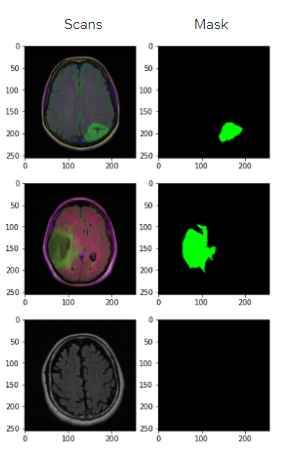

<hr>

>## **2.2 Mapping the real world problem to an ML problem**<br>
>> Using the concept of Deep Learning we have to perform a computer vision task, where we have to do segmentation on a given Brain MRI SCAN in order to identify Abnormalities on the brain Accordingly.



<hr>

>### **2.2.1 Type of Machine Leaning Problem**</br>
>> This is a binary class problem statement, where either the image pixel is classified as Normal or Abnormality

<hr>

>### **2.2.2 Performance Metric**</br>

>>*    **Intersection-Over-Union (Jaccard Index) SCORE**</br></br>
>> IoU is the area of overlap between the predicted segmentation and the ground truth divided by the area of union between the predicted segmentation and the ground truth
For binary (two classes) or multi-class segmentation, the mean IoU of the image is calculated by taking the IoU of each class and averaging them.








In [ ]:
#mounting driveSequence to sequence implementation
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#unzipping 1
!unzip /content/drive/MyDrive/BRAIN_MRI/archive.zip

In [ ]:
#importing libraries
import os,shutil
import pandas as pd
import numpy as np
import seaborn as sns
from osgeo import gdal
import matplotlib.pyplot as plt
from tqdm import tqdm

## **Exploratory data analysis (EDA)**

In [ ]:
#list of all the folders inside kaggle_3m folder excluding 'data.csv' and 'README.md'
folders=list(filter(lambda x: x not in ['data.csv','README.md'], os.listdir("/content/kaggle_3m/") ))

In [ ]:
#total number of folders
len(folders)

110

In [ ]:
#collecting all the images from all the 110 folders into scan and mask folders
try:
  os.mkdir("/content/scan/")
  os.mkdir("/content/mask/")
except:
  shutil.rmtree("scan/")
  shutil.rmtree("mask/")
  os.mkdir("/content/scan/")
  os.mkdir("/content/mask/")
####################################################################
for file in tqdm(folders):
  for image in os.listdir("/content/kaggle_3m/"+file):
    if "mask" not in image:
      shutil.copy("/content/kaggle_3m/"+file+"/"+image , "/content/scan/"+image)
    else:
      shutil.copy("/content/kaggle_3m/"+file+"/"+image , "/content/mask/"+image)

100%|██████████| 110/110 [00:03<00:00, 28.78it/s]


In [ ]:
#total number of scan and mask images
len( os.listdir("/content/mask/")),len( os.listdir("/content/scan/"))

(3929, 3929)

**Observation:**</br>
For every scan image we have its mask image , i.e no image is missing

In [ ]:
!pip install ColorThief
from colorthief import ColorThief

In [ ]:
#creating a function which will return the loction of abnormilty in the scan if there exist any.
def abmormility_locate(arr):
  """
  This function will return 
  1) focused location of abmornility i.e if the abnormility is in the 
  Top left portion of the scan it will only focus on Top Left portion 
  and rest three portion Top Right,Down Left, Down right will be 
  erased (white in color). <-- numpy array
  2) loction of the image <-- string
  """
  part1 = arr.GetRasterBand(1).ReadAsArray()[:128,:128]
  part2 = arr.GetRasterBand(1).ReadAsArray()[:128,128:]
  part3 = arr.GetRasterBand(1).ReadAsArray()[128:,:128]
  part4 = arr.GetRasterBand(1).ReadAsArray()[128:,128:]
  l=[part1.sum()/255,part2.sum()/255,part3.sum()/255,part4.sum()/255]
  n=list(map(lambda x: 255 if x!=max(l) else 0,l))
  lyr=np.vstack((np.hstack((part1+n[0],part2+n[1])),np.hstack((part3+n[2],part4+n[3]))))
  nimg=np.dstack((lyr,
                  lyr,
                  lyr))
  location=["Top_Left","Top_Right","Down_Left","Down_Right"]
  if sum(l)==0:
    nimg=np.dstack((lyr+255,
                  lyr+255,
                  lyr+255))
    return nimg,"No_Abnormility"
  else:
    return nimg,location[l.index(max(l))]

  0%|          | 0/20 [00:00<?, ?it/s]

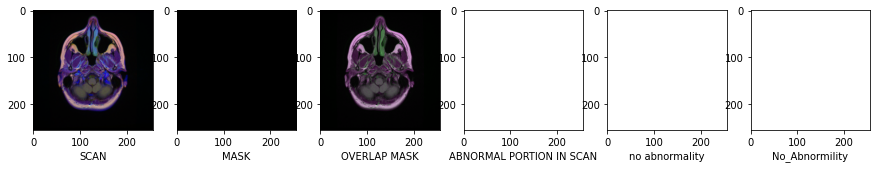

  5%|▌         | 1/20 [00:03<01:02,  3.29s/it]

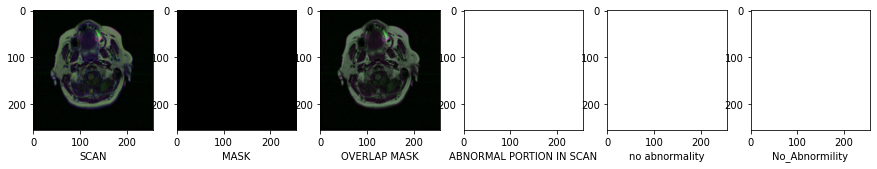

 10%|█         | 2/20 [00:06<00:59,  3.29s/it]

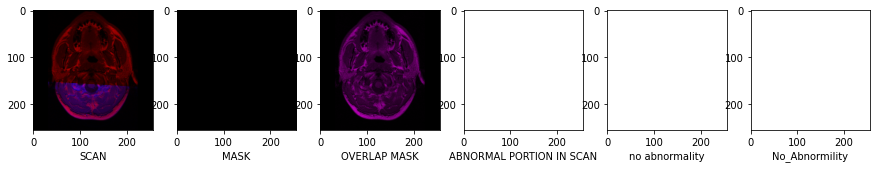

 15%|█▌        | 3/20 [00:09<00:55,  3.25s/it]

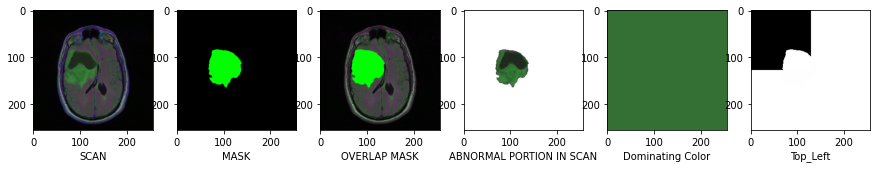

 20%|██        | 4/20 [00:12<00:51,  3.23s/it]

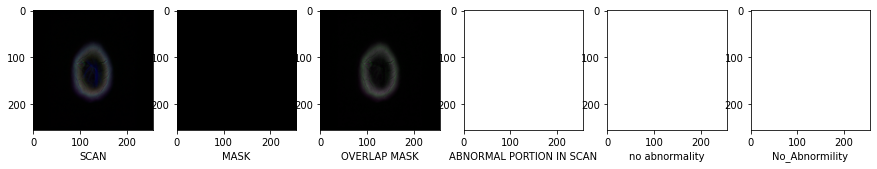

 25%|██▌       | 5/20 [00:16<00:48,  3.23s/it]

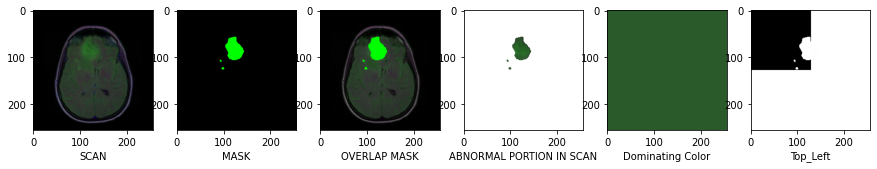

 30%|███       | 6/20 [00:19<00:45,  3.23s/it]

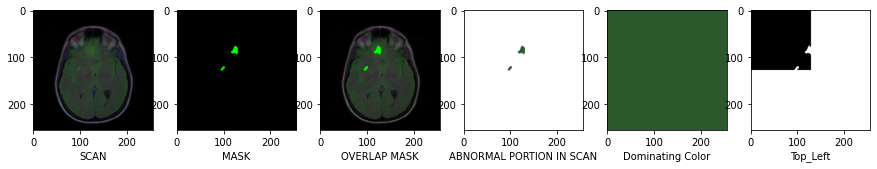

 35%|███▌      | 7/20 [00:22<00:41,  3.19s/it]

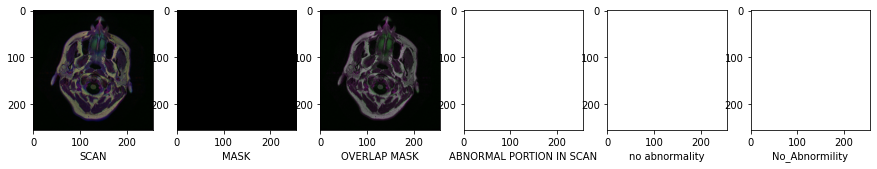

 40%|████      | 8/20 [00:25<00:38,  3.17s/it]

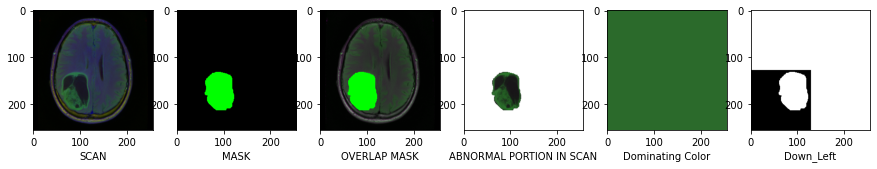

 45%|████▌     | 9/20 [00:29<00:35,  3.24s/it]

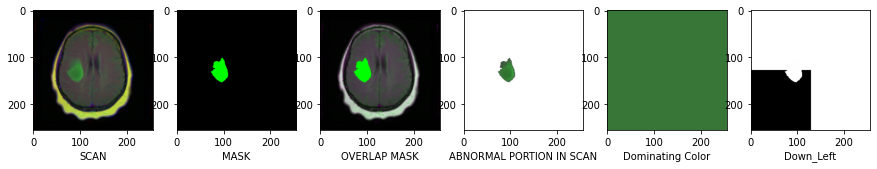

 50%|█████     | 10/20 [00:32<00:32,  3.23s/it]

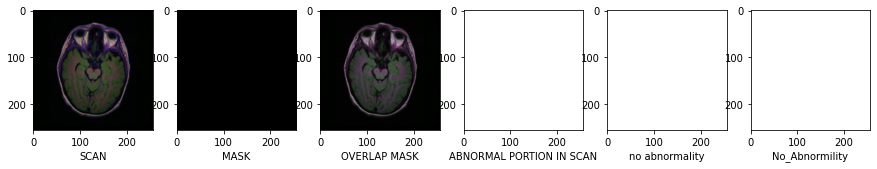

 55%|█████▌    | 11/20 [00:35<00:28,  3.21s/it]

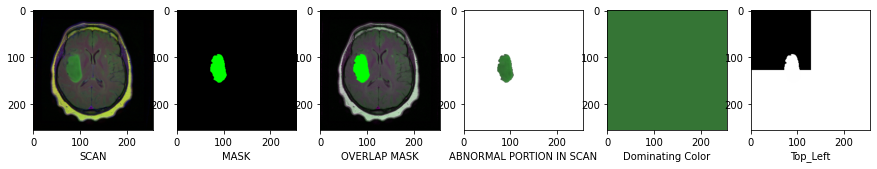

 60%|██████    | 12/20 [00:38<00:25,  3.20s/it]

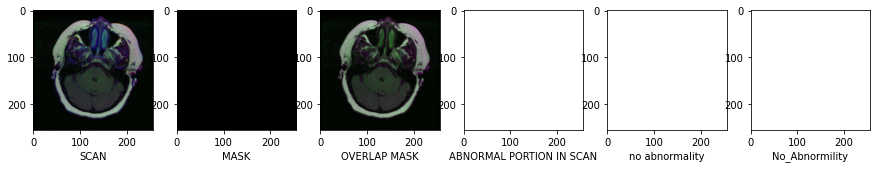

 65%|██████▌   | 13/20 [00:41<00:22,  3.20s/it]

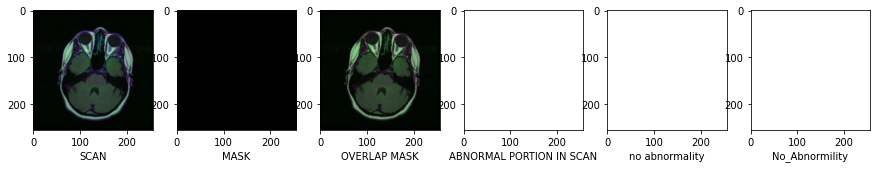

 70%|███████   | 14/20 [00:45<00:19,  3.19s/it]

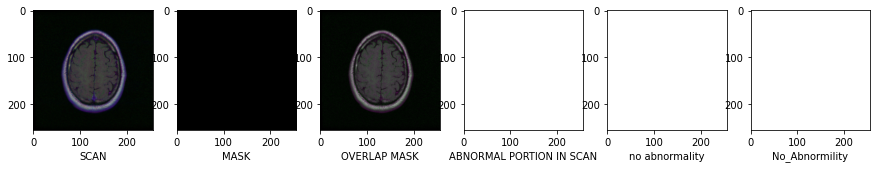

 75%|███████▌  | 15/20 [00:48<00:16,  3.21s/it]

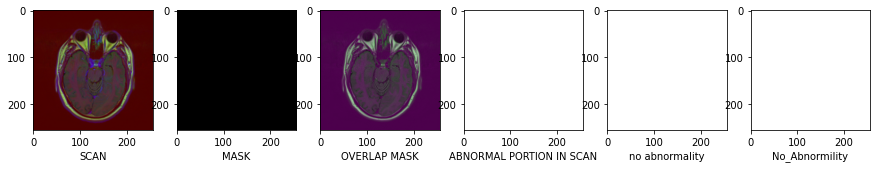

 80%|████████  | 16/20 [00:51<00:12,  3.20s/it]

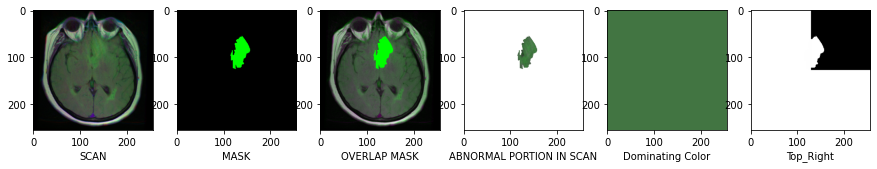

 85%|████████▌ | 17/20 [00:54<00:09,  3.19s/it]

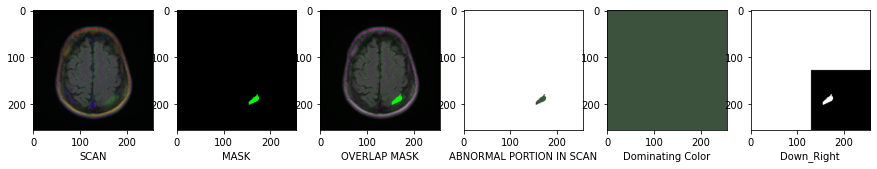

 90%|█████████ | 18/20 [00:58<00:06,  3.25s/it]

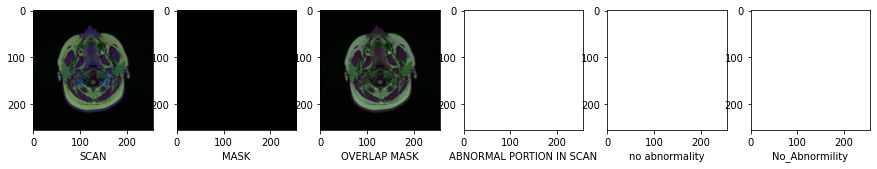

 95%|█████████▌| 19/20 [01:01<00:03,  3.23s/it]

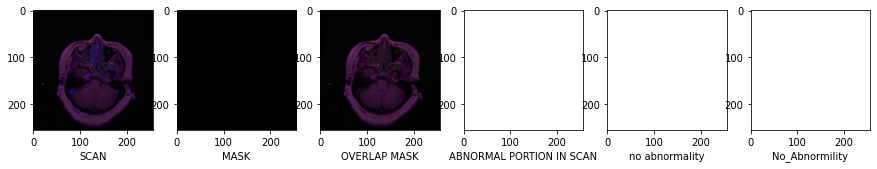

100%|██████████| 20/20 [01:04<00:00,  3.22s/it]


In [ ]:
import matplotlib.image as mpimg
import time
location=[]
dominating_color=[]
#plotting some sample raw scans ,mask, and mask overlap images, abstracted abnormilty image from scan, dominating color of abnormility, location of abnormilty
###########################################################
for i in tqdm(os.listdir("/content/scan/")[:20]):
  fig, axs = plt.subplots(1, 6, figsize = (15,5))
  dataset_scan = gdal.Open(r'/content/scan/'+i)
  img = np.dstack((dataset_scan.GetRasterBand(1).ReadAsArray(), dataset_scan.GetRasterBand(2).ReadAsArray(), dataset_scan.GetRasterBand(3).ReadAsArray()))
  axs[0].imshow(img)
  axs[0].set_xlabel('SCAN')
  ############################################################
  dataset_mask = gdal.Open(r'/content/mask/'+i.split(".tif")[0]+"_mask.tif")
  img_mask = np.dstack((np.zeros_like(dataset_mask.GetRasterBand(1).ReadAsArray()), dataset_mask.GetRasterBand(1).ReadAsArray(), np.zeros_like(dataset_mask.GetRasterBand(1).ReadAsArray())))
  axs[1].imshow(img_mask)
  axs[1].set_xlabel('MASK')
  G=dataset_mask.GetRasterBand(1).ReadAsArray()
  b1=dataset_scan.GetRasterBand(1).ReadAsArray()
  b2=np.zeros_like(dataset_mask.GetRasterBand(1).ReadAsArray())
  b3=dataset_scan.GetRasterBand(1).ReadAsArray()
  for ii,x in enumerate(G):
    for j,y in enumerate(x):
      if y==255:
        b1[ii][j]=0     #red
        b2[ii][j]=255   #green
        b3[ii][j]=0     #blue
      else:
        b2[ii][j]=dataset_scan.GetRasterBand(2).ReadAsArray()[ii][j]
  img = np.dstack((b1, b2 , b3))
  axs[2].imshow(img)
  axs[2].set_xlabel('OVERLAP MASK')
  ################################################################
  G=dataset_mask.GetRasterBand(1).ReadAsArray()
  b1=dataset_scan.GetRasterBand(1).ReadAsArray()
  b2=np.zeros_like(dataset_mask.GetRasterBand(1).ReadAsArray())
  b3=dataset_scan.GetRasterBand(1).ReadAsArray()
  for ii,x in enumerate(G):
    for j,y in enumerate(x):
      if y==255:
        b2[ii][j]=dataset_scan.GetRasterBand(2).ReadAsArray()[ii][j]
        # b1[ii][j]=0     #red
        # b2[ii][j]=255   #green
        # b3[ii][j]=0     #blue
      else:
        b1[ii][j]=255     #red
        b2[ii][j]=255   #green
        b3[ii][j]=255     #blue
  img = np.dstack((b1, b2 , b3))
  axs[3].imshow(img)Sequence to sequence implementation

  axs[3].set_xlabel('ABNORMAL PORTION IN SCAN')
  # try: os.remove('/content/mask/'+i.split(".tif")[0]+"_seg.png")
  # except: pass
  mpimg.imsave('/content/mask/'+i.split(".tif")[0]+"_seg.png", img)
  ##################################################################################################
  dominant_color_pixel = ColorThief('/content/mask/'+i.split(".tif")[0]+"_seg.png")
  try:
    dominant_color_pixel = dominant_color_pixel.get_color(quality=1)
    title4='Dominating Color'
  except:
    dominant_color_pixel=(255,255,255)
    title4="no abnormality"
  os.remove('/content/mask/'+i.split(".tif")[0]+"_seg.png")
  #=============================================================================
  G=dataset_mask.GetRasterBand(1).ReadAsArray()
  b1=dataset_scan.GetRasterBand(1).ReadAsArray()
  b2=np.zeros_like(dataset_mask.GetRasterBand(1).ReadAsArray())
  b3=dataset_scan.GetRasterBand(1).ReadAsArray()
  for ii,x in enumerate(G):
    for j,y in enumerate(x):
        b1[ii][j]=dominant_color_pixel[0]     #red
        b2[ii][j]=dominant_color_pixel[1]     #green
        b3[ii][j]=dominant_color_pixel[2]     #blue
  img1 = np.dstack((b1, b2 , b3))
  axs[4].imshow(img1)
  axs[4].set_xlabel(title4)
  dominating_color.append(tuple(img1[0][0]))
  #=============================================================================
  img,lct=abmormility_locate(dataset_mask)
  axs[5].imshow(img)
  axs[5].set_xlabel(lct)
  location.append(lct)
  plt.show()

In [ ]:
#creating a list of abnormility location, dominating color in scan if there exist any.
location=[]
dominating_color=[]
try:
  shutil.rmtree("/content/MASK/")
  os.mkdir("/content/MASK/")
except:
  os.mkdir("/content/MASK/")
for i in tqdm(os.listdir("/content/scan/")):
  dataset_scan = gdal.Open(r'/content/scan/'+i)
  dataset_mask = gdal.Open(r'/content/mask/'+i.split(".tif")[0]+"_mask.tif")
  ##############################################################################
  G=dataset_mask.GetRasterBand(1).ReadAsArray()
  b1=dataset_scan.GetRasterBand(1).ReadAsArray()
  b2=np.zeros_like(dataset_mask.GetRasterBand(1).ReadAsArray())Sequence to sequence implementationSequence to sequence implementation
  b3=dataset_scan.GetRasterBand(1).ReadAsArray()
  for ii,x in enumerate(G):
    for j,y in enumerate(x):
      if y==255:
        b2[ii][j]=dataset_scan.GetRasterBand(2).ReadAsArray()[ii][j]
        # b1[ii][j]=0     #red
        # b2[ii][j]=255   #green
        # b3[ii][j]=0     #blue
      else:
        b1[ii][j]=255     #red
        b2[ii][j]=255   #green
        b3[ii][j]=255     #blue
  img = np.dstack((b1, b2 , b3))
  # try: os.remove('/content/mask/'+i.split(".tif")[0]+"_seg.png")
  # except: pass
  mpimg.imsave('/content/MASK/'+i.split(".tif")[0]+"_seg.png", img)
  ##################################################################################################
  dominant_color_pixel = ColorThief('/content/MASK/'+i.split(".tif")[0]+"_seg.png")
  try:
    dominant_color_pixel = dominant_color_pixel.get_color(quality=1)
    title4='Dominating Color'
  except:
    dominant_color_pixel=(255,255,255)
    title4="no abnormality"
  # os.remove('/content/MASK/'+i.split(".tif")[0]+"_seg.png")
  #=============================================================================
  G=dataset_mask.GetRasterBand(1).ReadAsArray()
  b1=dataset_scan.GetRasterBand(1).ReadAsArray()
  b2=np.zeros_like(dataset_mask.GetRasterBand(1).ReadAsArray())
  b3=dataset_scan.GetRasterBand(1).ReadAsArray()
  for ii,x in enumerate(G):
    for j,y in enumerate(x):
        b1[ii][j]=dominant_color_pixel[0]     #red
        b2[ii][j]=dominant_color_pixel[1]     #green
        b3[ii][j]=dominant_color_pixel[2]     #blue
  img1 = np.dstack((b1, b2 , b3))
  dominating_color.append(tuple(img1[0][0]))
  ##############################################################################
  img,lct=abmormility_locate(dataset_mask)
  location.append(lct)

100%|██████████| 3929/3929 [20:12<00:00,  3.24it/s]


In [ ]:
#creating a dictionary having rgb value as key and color name as value
dic_color={
(0, 0, 0) : 'Black',
(127, 127, 127) : 'Gray',
(136, 0, 21) : 'Bordeaux',
(237, 28, 36) : 'red',
(255, 127, 39) : 'orange',
(255, 242, 0) : 'yellow',
(34, 177, 76) : 'green',
(203, 228, 253) : 'blue',
(0, 162, 232) : 'dark blue',
(63, 72, 204) : 'purple',
(255, 255, 255) : 'white',
(195, 195, 195) : 'light gray',
(185, 122, 87) : 'light brown',
(255, 174, 201) : 'light pink',
(255, 201, 14) : 'dark yellow',
(239, 228, 176) : 'light yellow',
(181, 230, 29) : 'light green',
(153, 217, 234) : 'light blue',
(112, 146, 190) : 'dark blue',
(200, 191, 231) : 'light purple'}

In [ ]:
#https://stackoverflow.com/questions/54242194/python-find-the-closest-color-to-a-color-from-giving-list-of-colors
import math
COLORS=dic_color.keys()
def closest_color(rgb):
    """
    This function will take RGB value and return the closest color name from the COLORS dictionary.
    """
    r, g, b = rgb
    color_diffs = []
    for color in COLORS:
        cr, cg, cb = color
        color_diff = math.sqrt((r - cr)**2 + (g - cg)**2 + (b - cb)**2)
        color_diffs.append((color_diff, color))
    return dic_color[min(color_diffs)[1]]

In [ ]:
#creating a data frame for those images which has some abnormility and store their closest dominating color
dc=np.array(list(filter(lambda x: sum(x)!=255*3, dominating_color)))
dcolor_nearest_color=list(map(closest_color,dc))
df=pd.DataFrame()
df["closest_color"]=dcolor_nearest_color

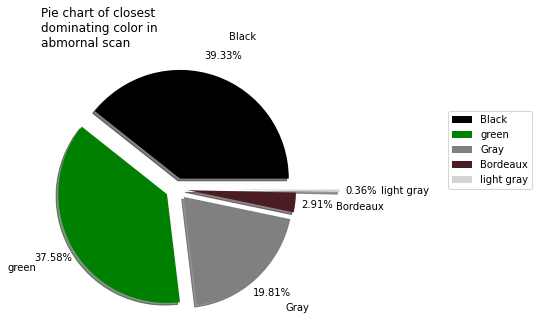

In [ ]:
#plotting Pie chart of closest dominating color in abmornal scan.
fig=plt.figure(figsize=(8,5))
explodes = [0.1]+[0.1]*(len(df["closest_color"].value_counts())-3)+[0.1]+[0.5]
plt.pie(labels=df["closest_color"].value_counts().keys(), x=df["closest_color"].value_counts().values, pctdistance=1.2, labeldistance=1.38,explode=explodes,autopct='%1.2f%%',shadow = True,colors=["black","green","gray","#4C1C24","#D3D3D3"])
plt.title("Pie chart of closest \ndominating color in \nabmornal scan",loc="left")
plt.legend(loc=(1.5,0.5))
plt.show()

###Observation:-
- If there exist any abnormilties in scan then the probability that the abnormility are


1.   **Black** in color is **39.33%**
2.   **Green** in color is **37.58%**
3.   **Gray** in color is **19.81%**
4.   **Bordeaux** in color is **2.91%**
5.   **Light gray** in color is **0.36%**



In [ ]:
#creating a data frame for those images which has some abnormility and store their location of abnormility
lc=np.array(list(filter(lambda x: x!="No_Abnormility", location)))
df=pd.DataFrame()
df["lctn"]=list(map(str,lc))

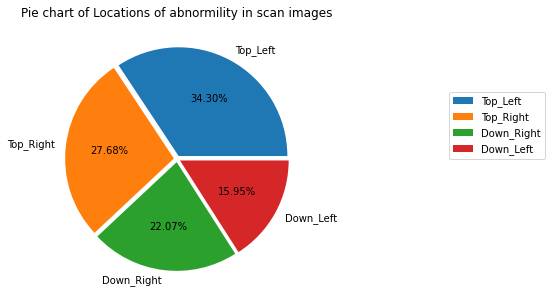

In [ ]:
#Plotting pie chart of Locations of abnormility in scan images
fig=plt.figure(figsize=(5,5))
explodes = [0.03]*len(df["lctn"].value_counts())
plt.pie(labels=df["lctn"].value_counts().keys(), x=df["lctn"].value_counts().values,autopct='%1.2f%%',explode=explodes)
plt.title("Pie chart of Locations of abnormility in scan images")
plt.legend(loc=(1.5,0.5))
plt.show()

###Observation:-
- If there exist any abnormilties in scan then the probability that the abnormilities are present in


1.   **Top Left** is **34.30%**
2.   **Top Right** is **27.68%**
3.   **Down Right** is **22.07%**
3.   **Down Left** is **15.95%**

In [ ]:
#creating a dataframe containing mask image path, scan image path and their corresponding shape,  percentage of pixel with abnormality in mask image
import cv2
mask_image_paths=[]
scan_image_paths=[]
mask_image_shapes=[]
scan_image_shapes=[]
abnormality_percentage_area=[]
for i in tqdm(os.listdir("/content/scan/")):
  scan_image = cv2.imread('scan/'+i)
  mask_image = cv2.imread("mask/"+i.split(".")[0]+"_mask.tif")
  #################################################
  abnormal_area_percentage=((sum(mask_image.flatten())/(256*256*3*255))*100)             #percentage of pixel with abnormality
  abnormality_percentage_area.append(abnormal_area_percentage)
  #################################################
  mask_image_paths.append('scan/'+i)
  scan_image_paths.append("mask/"+i.split(".")[0]+"_mask.tif")
  mask_image_shapes.append(scan_image.shape)
  scan_image_shapes.append(mask_image.shape)
################################################################
df=pd.DataFrame()
df["mask_image_paths"]=mask_image_paths
df["scan_image_paths"]=scan_image_abnormality_percentage_areapaths
df["mask_image_shapes"]=mask_image_shapes
df["scan_image_shapes"]=scan_image_shapes
df["abnormality_percentage_area"]=abnormality_percentage_area
################################################################

100%|██████████| 3929/3929 [02:11<00:00, 29.86it/s]


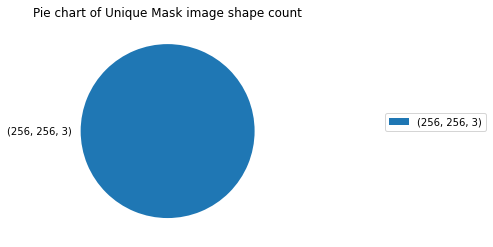

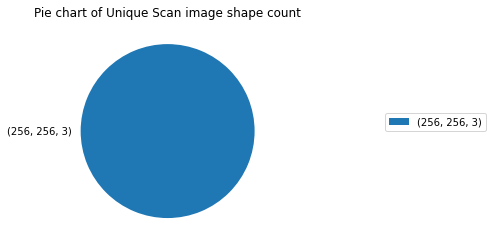

In [ ]:
#Checking unique shape Counts
mask_shape=list(dict(df["mask_image_shapes"].value_counts()).keys())
mask_shape_count=list(dict(df["mask_image_shapes"].value_counts()).values())
plt.pie(x=mask_shape_count, labels=mask_shape)
plt.title("Pie chart of Unique Mask image shape count")
plt.legend(loc=(1.5,0.5))
plt.show()
###############################################################
scan_shape=list(dict(df["scan_image_shapes"].value_counts()).keys())
scan_shape_count=list(dict(df["scan_image_shapes"].value_counts()).values())
plt.pie(x=scan_shape_count, labels=scan_shape)
plt.title("Pie chart of Unique Scan image shape count")
plt.legend(loc=(1.5,0.5))
plt.show()

In [ ]:
df["location"]=locationlocation
dc=np.array(list(filter(lambda x: x, dominating_color)))
dcolor_nearest_color=list(map(closest_color,dc))
df["closest_color"]=dcolor_nearest_color


In [ ]:
df

,mask_image_paths,scan_image_paths,mask_image_shapes,scan_image_shapes,abnormality_percentage_area,location,closest_color
0,scan/TCGA_HT_7874_19950902_3.tif,mask/TCGA_HT_7874_19950902_3_mask.tif,"(256, 256, 3)","(256, 256, 3)",0.000000,No_Abnormility,white
1,scan/TCGA_DU_5854_19951104_5.tif,mask/TCGA_DU_5854_19951104_5_mask.tif,"(256, 256, 3)","(256, 256, 3)",0.000000,No_Abnormility,white
2,scan/TCGA_CS_5393_19990606_1.tif,mask/TCGA_CS_5393_19990606_1_mask.tif,"(256, 256, 3)","(256, 256, 3)",0.000000,No_Abnormility,white
3,scan/TCGA_FG_6689_20020326_27.tif,mask/TCGA_FG_6689_20020326_27_mask.tif,"(256, 256, 3)","(256, 256, 3)",6.347656,Top_Left,green
4,scan/TCGA_EZ_7264_20010816_24.tif,mask/TCGA_EZ_7264_20010816_24_mask.tif,"(256, 256, 3)","(256, 256, 3)",0.000000,No_Abnormility,white
...,...,...,...,...,...,...,...
3924,scan/TCGA_CS_5396_20010302_16.tif,mask/TCGA_CS_5396_20010302_16_mask.tif,"(256, 256, 3)","(256, 256, 3)",6.350708,Top_Left,Black
3925,scan/TCGA_DU_5874_19950510_33.tif,mask/TCGA_DU_5874_19950510_33_mask.tif,"(256, 256, 3)","(256, 256, 3)",0.000000,No_Abnormility,white
3926,scan/TCGA_FG_5964_20010511_14.tif,mask/TCGA_FG_5964_20010511_14_mask.tif,"(256, 256, 3)","(256, 256, 3)",2.117920,Down_Right,Gray
3927,scan/TCGA_HT_7690_19960312_14.tif,mask/TCGA_HT_7690_19960312_14_mask.tif,"(256, 256, 3)","(256, 256, 3)",4.368591,Top_Left,Gray


**Observation:-**<br>
Shape of all the scan and mask images are same i.e ( 256 x 256 ) 

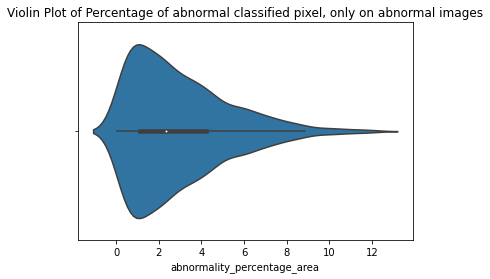

count    1373.000000
mean        2.947129
std         2.334002
min         0.010681
25%         1.121521
50%         2.333069
75%         4.219055
max        12.098694
Name: abnormality_percentage_area, dtype: float64
10th percentile --> 0.48004150390625006
20th percentile --> 0.87738037109375
30th percentile --> 1.30096435546875
40th percentile --> 1.83990478515625
50th percentile --> 2.33306884765625
60th percentile --> 3.0108642578125
70th percentile --> 3.76373291015625
80th percentile --> 4.715270996093752
90th percentile --> 6.336669921874998
91th percentile --> 6.4495849609375
92th percentile --> 6.78863525390625
93th percentile --> 6.92578125
94th percentile --> 7.2583618164062464
95th percentile --> 7.526245117187499
96th percentile --> 7.883544921874998
97th percentile --> 8.383056640624998
98th percentile --> 8.902465820312496
99th percentile --> 10.095275878906248


In [ ]:
sns.violinplot(x=df[df["abnormality_percentage_area"]!=0]["abnormality_percentage_area"])
plt.title("Violin Plot of Percentage of abnormal classified pixel, only on abnormal images")
plt.show()
#################################################################################
print("="*100)
print(df[df["abnormality_percentage_area"]!=0]["abnormality_percentage_area"].describe())
print("="*100)
for i in list(range(10,100,10))+list(range(91,100,1)):
  print(f'{i}th percentile --> {np.percentile(list(df[df["abnormality_percentage_area"]!=0]["abnormality_percentage_area"]),i)}' )

**Observation:-**<br>
*    In Almost half of the abnormal mask images, percentage of pixel classified as abnormal is less then 2.3331, and maximum 12% of pixel that are classified as abnormal.
*    In most of the mask images which has some abnormality, the abormality was found in very small area, like most of them are spread in only 1% of total image area 

In [ ]:
#creating 2 class to know whether the scan image has any abnormality or not
from osgeo import gdal
import matplotlib.pyplot as plt
labels=[]
for i in os.listdir("/content/scan/"):
  scan_path="scan/"+i
  mask_path ="mask/"+i.split(".")[0]+"_mask.tif"
  mask_d = gdal.Open(mask_path)
  scan_d = gdal.Open(scan_path)
  if (mask_d.GetRasterBand(1).ReadAsArray()==np.zeros_like(mask_d.GetRasterBand(1).ReadAsArray())).all():
    labels.append("Normal")
  else:
    labels.append("Abnormality")

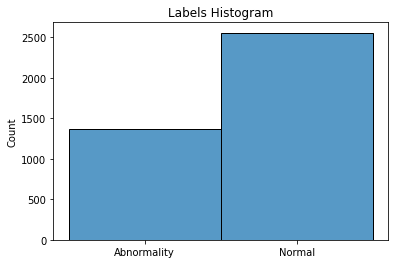

In [ ]:
#Plotting histogram of new introduced classes to know the imbalancing
sns.histplot(labels)
plt.title("Labels Histogram")
plt.show()

In [ ]:
#exact count of new introduced classes
print("Normal ", labels.count("Normal") )
print("Abnormality ", labels.count("Abnormality") )

Normal  2556
Abnormality  1373


###Observation:-
- Most of the scan does not contain any abnormilty

In [ ]:
#collecting all the labels, scan image path and thier correspoding mask images path into the list 
scans=list( map( lambda x: x, os.listdir( "/content/scan/" ) ) )
SCAN_IMAGES_PATH=[]
MASK_IMAGES_PATH=[]
LABELS=[]
for s in tqdm(scans):
  scan_path="scan/"+s
  mask_path ="mask/"+s.split(".")[0]+"_mask.tif"
  mask_d = gdal.Open(mask_path)
  scan_d = gdal.Open(scan_path)
  if (mask_d.GetRasterBand(1).ReadAsArray()==np.zeros_like(mask_d.GetRasterBand(1).ReadAsArray())).all(): lab=0
  else: lab=1
  SCAN_IMAGES_PATH.append(scan_path)
  MASK_IMAGES_PATH.append("mask/"+s.split(".")[0]+"_mask.tif")
  LABELS.append(lab)

100%|██████████| 3929/3929 [00:01<00:00, 2897.33it/s]


In [ ]:
#creating dataframe from all the collected path and labels in the previous step
df=pd.DataFrame()
df["image"]=SCAN_IMAGES_PATH
df["mask"]=MASK_IMAGES_PATH
df["LABELS"]=LABELS
df

,image,mask,LABELS
0,scan/TCGA_HT_7874_19950902_3.tif,mask/TCGA_HT_7874_19950902_3_mask.tif,0
1,scan/TCGA_DU_5854_19951104_5.tif,mask/TCGA_DU_5854_19951104_5_mask.tif,0
2,scan/TCGA_CS_5393_19990606_1.tif,mask/TCGA_CS_5393_19990606_1_mask.tif,0
3,scan/TCGA_FG_6689_20020326_27.tif,mask/TCGA_FG_6689_20020326_27_mask.tif,1
4,scan/TCGA_EZ_7264_20010816_24.tif,mask/TCGA_EZ_7264_20010816_24_mask.tif,0
...,...,...,...
3924,scan/TCGA_CS_5396_20010302_16.tif,mask/TCGA_CS_5396_20010302_16_mask.tif,1
3925,scan/TCGA_DU_5874_19950510_33.tif,mask/TCGA_DU_5874_19950510_33_mask.tif,0
3926,scan/TCGA_FG_5964_20010511_14.tif,mask/TCGA_FG_5964_20010511_14_mask.tif,1
3927,scan/TCGA_HT_7690_19960312_14.tif,mask/TCGA_HT_7690_19960312_14_mask.tif,1


In [ ]:
#labels count
df["LABELS"].value_counts()

0    2556
1    1373
Name: LABELS, dtype: int64

In [ ]:
#randomly stratified spliting into train and test datset in the ratio of 7:3
from sklearn.model_selection import train_test_split
X_train, X_test = train_test_split(df, test_size=0.3, random_state=42, stratify=df["LABELS"])

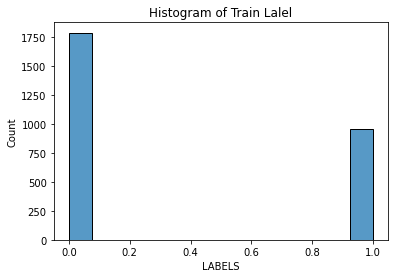

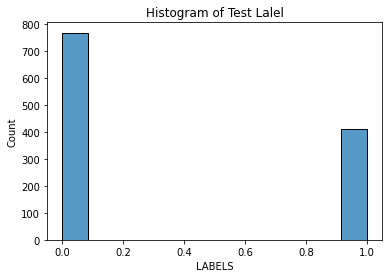

In [ ]:
#Train and Test label distribution
sns.histplot(X_train["LABELS"])
plt.title("Histogram of Train Lalel")
plt.show()
sns.histplot(X_test["LABELS"])
plt.title("Histogram of Test Lalel")
plt.show()

In [ ]:
#installing tensorflow==2.2.0, keras==2.3.1
!pip install tensorflow==2.2.0
!pip install keras==2.3.1

     |████████████████████████████████| 516.2 MB 3.8 kB/s 
     |████████████████████████████████| 454 kB 51.3 MB/s 
     |████████████████████████████████| 3.0 MB 30.3 MB/s 
     |████████████████████████████████| 2.9 MB 36.8 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.8.0
    Uninstalling tensorboard-2.8.0:
      Successfully uninstalled tensorboard-2.8.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
  Attempting uninstall: gast
    Found existing installation: gast 0.5.3
    Uninstalling gast-0.5.3:
      Successfully uninstalled gast-0.5.3
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.0
    Uninstalli

In [ ]:
#installing segmentation_models
!pip install git+https://github.com/qubvel/segmentation_models

  Cloning https://github.com/qubvel/segmentation_models to /tmp/pip-req-build-3cc674h1
  Running command git clone -q https://github.com/qubvel/segmentation_models /tmp/pip-req-build-3cc674h1
  Running command git submodule update --init --recursive -q
  Created wheel for segmentation-models: filename=segmentation_models-1.0.1-py3-none-any.whl size=33810 sha256=419c58e63275ec11c4eb4c8c5a2e00bc8e739e780b276a504260080ebd3f4a8e
  Stored in directory: /tmp/pip-ephem-wheel-cache-d7kg1k98/wheels/02/cd/18/61c0bbb8766acfec68f9d20618886b7b38dfeeb95865b6ba00
Successfully built segmentation-models


In [ ]:
#importing some libraries 
#using keras framework in backend 
from tensorflow import keras
import tensorflow as tf
# SM_FRAMEWORK=keras
import segmentation_models as sm
from segmentation_models import Unet
sm.set_framework('keras')
keras.backend.set_image_data_format('channels_last')

Using TensorFlow backend.


Segmentation Models: using `keras` framework.


In [ ]:
#using Unet architecture with backbone name resnet50 and input shape 256,256,3 also not training encoder weights
model = Unet('resnet50', encoder_weights='', classes=2, activation='softmax', input_shape=(256,256,3),encoder_freeze=True)
#model summary
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, 256, 256, 3)  9           data[0][0]                       
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, 262, 262, 3)  0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, 128, 128, 64) 9408        zero_padding2d_1[0][0]           
____________________________________________________________________________________________

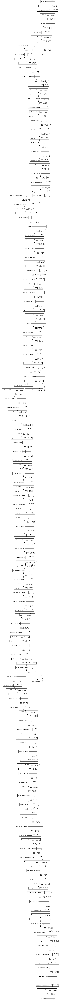

In [ ]:
tf.keras.utils.plot_model(
    model,                      # here is the trick (for now)
    to_file='model.png', dpi=96,              # saving  
    show_shapes=True, show_layer_names=True,  # show shapes and layer name
    expand_nested=False                       # will show nested block
)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#traing data augmentation parameter
train_gen_aug = dict(rotation_range=0.2,
                        width_shift_range=0.05,
                        height_shift_range=0.05,
                        shear_range=0.05,
                        zoom_range=0.05,
                        horizontal_flip=True,
                        fill_mode='nearest')

In [ ]:
#https://www.kaggle.com/saivikassingamsetty/mea-unet-cbam-median-14-12
#adjustment into the image
def adjust(img,mask):
    #normalization
    img = img / 255.

    #mask
    mask = mask / 255.
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0

    return (img, mask)

In [ ]:
#https://www.kaggle.com/saivikassingamsetty/mea-unet-cbam-median-14-12
#data generator 
def train_generator(dataframe, batch_size, aug_dict, 
                    image_color_mode = "rgb",
                    mask_color_mode = "rgb",
                    image_save_prefix = "image",
                    mask_save_prefix = "mask",
                    save_to_dir = None,
                    target_size = (256,256),
                    seed = 1):
    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)

  #image
    image_generator = image_datagen.flow_from_dataframe(
          dataframe,
          x_col = "image",
          target_size = target_size,
          batch_size = batch_size,
          class_mode = None,
          color_mode = image_color_mode,
          save_to_dir = save_to_dir,
          save_prefix = image_save_prefix,
          seed = seed )

      #mask
    mask_generator = mask_datagen.flow_from_dataframe(
          dataframe,
          x_col = "mask",
          target_size = target_size,
          batch_size = batch_size,
          class_mode = None,
          color_mode = mask_color_mode,
          save_to_dir = save_to_dir,
          save_prefix = mask_save_prefix,
          seed = seed)
  
  #combining the generators to make a whole generator
    train_gen = zip(image_generator, mask_generator)

  #data adjustment
    for (img, mask) in train_gen:
        img, mask = adjust(img, mask)
        yield (img,mask)

In [ ]:
BATCH_SIZE=20
train_gen = train_generator(X_train, batch_size= BATCH_SIZE, aug_dict = train_gen_aug)
test_gen = train_generator(X_test, batch_size = BATCH_SIZE, aug_dict = dict())

In [ ]:
from segmentation_models.metrics import iou_score
from segmentation_models import Unet
model.compile(tf.keras.optimizers.Adam(0.001) , sm.losses.cce_dice_loss, metrics=[sm.metrics.IOUScore(threshold=0.5)])

In [ ]:
import datetime
from tensorflow.keras.callbacks import ModelCheckpoint,ReduceLROnPlateau,TensorBoard
log_dir="/content/drive/MyDrive/BRAIN_MRI/logs2/fit"  + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [ ]:
# defining callbacks
###########################################################################################################################################
tensorboard_callback= TensorBoard(log_dir=log_dir,histogram_freq=1)
###########################################################################################################################################
lr_reducer= ReduceLROnPlateau(monitor='val_iou_score', min_lr=0.000001,patience=2,factor=0.9)
###########################################################################################################################################
chackpoint= ModelCheckpoint('/content/drive/MyDrive/BRAIN_MRI/unetmodel2.h5',monitor='val_iou_score')
###########################################################################################################################################
callbacks = [tensorboard_callback, chackpoint,lr_reducer]

In [ ]:
#model trainingtrain_gen
model.fit_generator(train_gen, steps_per_epoch=len(X_train)//BATCH_SIZE, epochs=20,validation_data=test_gen, callbacks=callbacks,validation_steps= len(X_train)//BATCH_SIZE)

Epoch 1/20
Found 1179 validated image filenames.
Found 1179 validated image filenames.
Found 2750 validated image filenames.
Found 2750 validated image filenames.
137/137 [==============================] - 381s 3s/step - loss: 0.8042 - iou_score: 0.1663 - val_loss: 1.0226 - val_iou_score: 0.0050
Epoch 2/20
137/137 [==============================] - 350s 3s/step - loss: 0.6731 - iou_score: 0.2826 - val_loss: 1.0478 - val_iou_score: 0.0050
Epoch 3/20
137/137 [==============================] - 345s 3s/step - loss: 0.6483 - iou_score: 0.3114 - val_loss: 1.0343 - val_iou_score: 0.0048
Epoch 4/20
137/137 [==============================] - 344s 3s/step - loss: 0.6318 - iou_score: 0.3309 - val_loss: 1.0314 - val_iou_score: 0.0053
Epoch 5/20
137/137 [==============================] - 344s 3s/step - loss: 0.6311 - iou_score: 0.3329 - val_loss: 0.9407 - val_iou_score: 0.0577
Epoch 6/20
137/137 [==============================] - 344s 3s/step - loss: 0.6141 - iou_score: 0.3540 - val_loss: 0.8027 - 

In [ ]:
model.fit_generator(train_gen, steps_per_epoch=len(X_train)//BATCH_SIZE, epochs=50,validation_data=test_gen, callbacks=callbacks,validation_steps= len(X_train)//BATCH_SIZE, initial_epoch=20)

Epoch 21/50
137/137 [==============================] - 346s 3s/step - loss: 0.5780 - iou_score: 0.4068 - val_loss: 0.5851 - val_iou_score: 0.3910
Epoch 22/50
137/137 [==============================] - 344s 3s/step - loss: 0.5776 - iou_score: 0.4074 - val_loss: 0.6033 - val_iou_score: 0.3907
Epoch 23/50
137/137 [==============================] - 345s 3s/step - loss: 0.5792 - iou_score: 0.4040 - val_loss: 0.6378 - val_iou_score: 0.3870
Epoch 24/50
137/137 [==============================] - 345s 3s/step - loss: 0.5791 - iou_score: 0.4054 - val_loss: 0.5728 - val_iou_score: 0.3969
Epoch 25/50
137/137 [==============================] - 345s 3s/step - loss: 0.5766 - iou_score: 0.4083 - val_loss: 0.5955 - val_iou_score: 0.3921
Epoch 26/50
137/137 [==============================] - 345s 3s/step - loss: 0.5783 - iou_score: 0.4063 - val_loss: 0.5815 - val_iou_score: 0.3962
Epoch 27/50
137/137 [==============================] - 345s 3s/step - loss: 0.5764 - iou_score: 0.4093 - val_loss: 0.5863 - 

In [ ]:
#plotting tensorboard
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/BRAIN_MRI/logs2

<IPython.core.display.Javascript object>

In [ ]:
#model training
model.load_weights('/content/drive/MyDrive/BRAIN_MRI/unetmodel.h5')

In [ ]:
X_test

,image,mask,LABELS
3136,scan/TCGA_DU_8162_19961029_26.tif,mask/TCGA_DU_8162_19961029_26_seg.png,0
1708,scan/TCGA_DU_5872_19950223_62.tif,mask/TCGA_DU_5872_19950223_62_seg.png,0
1347,scan/TCGA_DU_A5TT_19980318_17.tif,mask/TCGA_DU_A5TT_19980318_17_seg.png,0
3492,scan/TCGA_HT_8105_19980826_22.tif,mask/TCGA_HT_8105_19980826_22_seg.png,1
2922,scan/TCGA_DU_8165_19970205_1.tif,mask/TCGA_DU_8165_19970205_1_seg.png,0
...,...,...,...
1736,scan/TCGA_DU_6400_19830518_23.tif,mask/TCGA_DU_6400_19830518_23_seg.png,1
178,scan/TCGA_DU_A5TP_19970614_36.tif,mask/TCGA_DU_A5TP_19970614_36_seg.png,0
1600,scan/TCGA_DU_7304_19930325_29.tif,mask/TCGA_DU_7304_19930325_29_seg.png,1
1335,scan/TCGA_HT_7473_19970826_20.tif,mask/TCGA_HT_7473_19970826_20_seg.png,1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

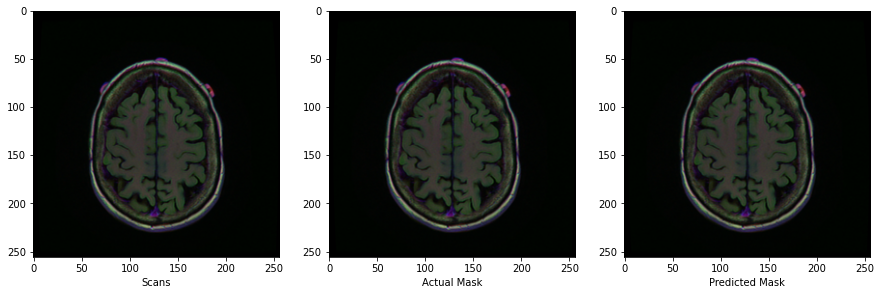

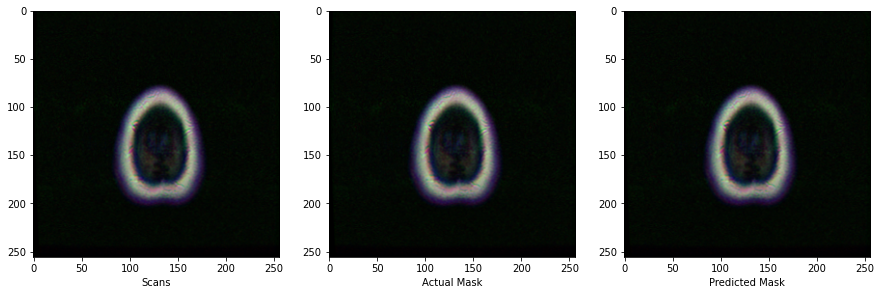

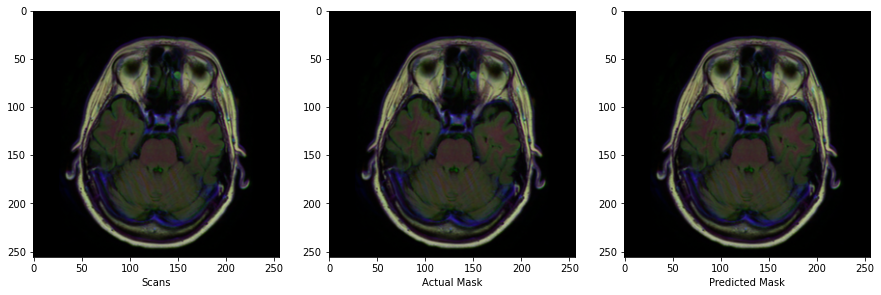

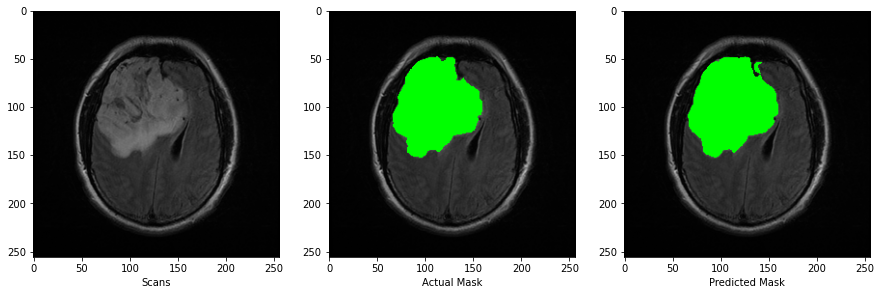

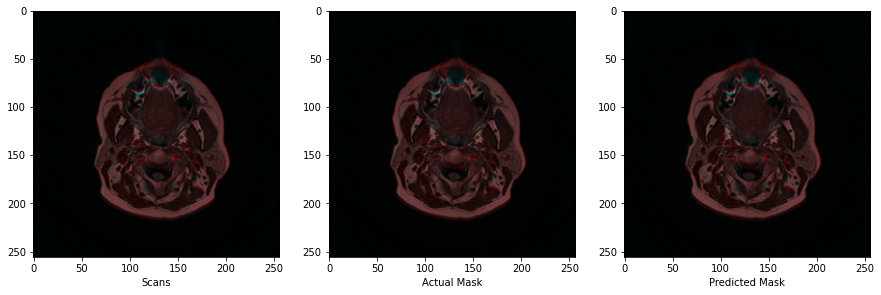

...

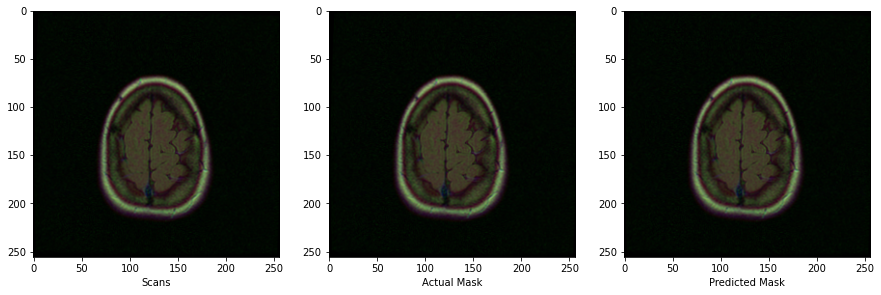

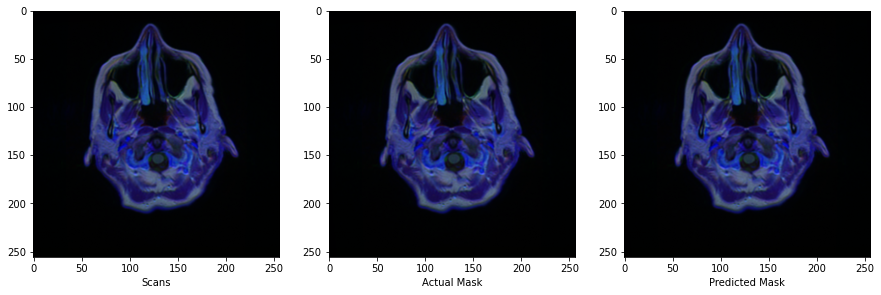

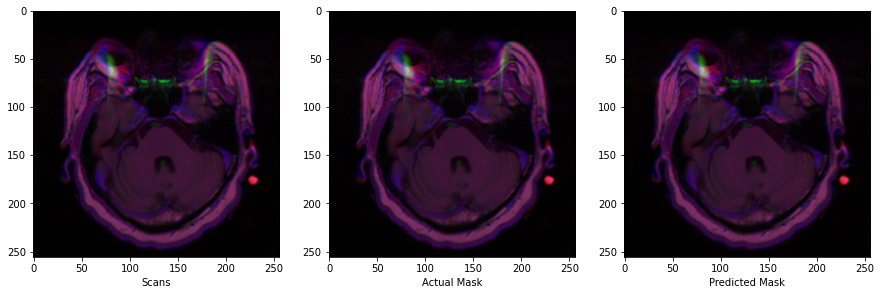

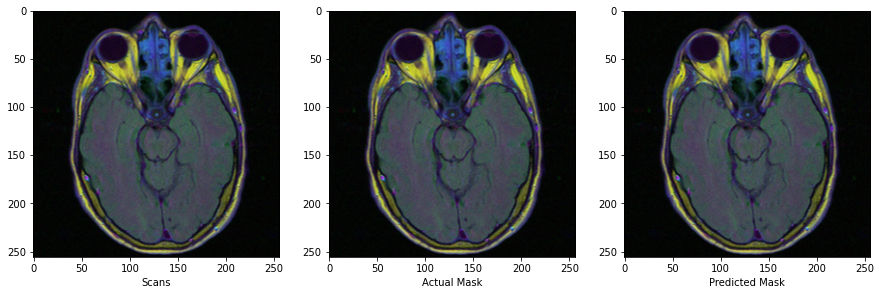

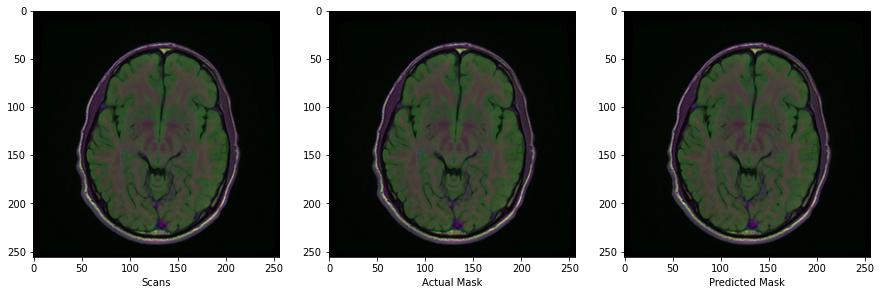

In [ ]:
#https://www.kaggle.com/saivikassingamsetty/mea-unet-cbam-median-14-12
#plotting 50 scans, actual mask and their corresponding predicted mask image
import numpy as np
import cv2 as cv
import cv2
IMG_SIZE=(256,256)
for i in range(50):
    index=i
    img = cv.imread(X_test['image'].iloc[index])
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    img = cv.resize(img ,IMG_SIZE)
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)
    img = np.squeeze(img)

    original = img.copy()
    fig, ax = plt.subplots(1,3,figsize = (15,5))
    ax[0].imshow(original)
    ax[0].set_xlabel('Scans')
    
    main = original.copy()
    label = cv.imread(X_test['mask'].iloc[index])
    sample = np.array(np.squeeze(label), dtype = np.uint8)
    contours, hier = cv2.findContours(sample[:,:,0],cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
    sample_over_gt = cv2.drawContours(main, contours, -1,[0,255,0], thickness=-1)
    ax[1].imshow(sample_over_gt)
    ax[1].set_xlabel('Actual Mask')
    
    main = original.copy()
    sample = np.array(np.squeeze(pred) > 0.5, dtype = np.uint8)
    contours, hier = cv2.findContours(sample[:,:,0],cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
    sample_over_pr = cv2.drawContours(main, contours, -1, [0,255,0], thickness=-1)
    ax[2].imshow(sample_over_pr)
    ax[2].set_xlabel("Predicted Mask")

plt.show()

# Analysis on Model prediction

In [ ]:
def pred_pr_score(img_mask,l):
  """
  Given the anctual mask and predicted mask image this function will return their precision score
  """
  c=0
  for i,j in zip(img_mask[0].flatten(),np.array(l).flatten()):
    if i==j==1:
      c=c+1
  if list(img_mask[0].flatten()).count(1)==0:
    print(set(img_mask[0].flatten()))
  if list(np.array(l).flatten()).count(1)==0:
    print(set(np.array(l).flatten()))
    print(list(img_mask[0].flatten()).count(1))
  return c/list(np.array(l).flatten()).count(1) if list(np.array(l).flatten()).count(1)!=0 else 0

In [ ]:
def mask_prediction_evaluation_score(X_test):
  """
  Given the DataFrame 
  This function will add score column with thier precision score for only those images only where abnormility is present
  """
  score=[]
  df=X_test[X_test["LABELS"]==1]
  for i in tqdm(range(len(df))):
    index=i
    img = cv.imread(df['image'].iloc[index])
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    img = cv.resize(img ,IMG_SIZE)
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)

    img_mask = cv.imread(df['mask'].iloc[index])
    img_mask = cv.cvtColor(img_mask, cv.COLOR_BGR2RGB)
    img_mask = cv.resize(img_mask ,IMG_SIZE)
    img_mask = img_mask / 255
    img_mask = img_mask[np.newaxis, :, :, :]

    l=[]
    for i in pred[0][:,:,1]:
      l1=[]
      for j in i:
        if j>0.5:
          l1.append([0,0,0])
        else:
          l1.append([1,1,1])
      l.append(l1)
    score.append(pred_pr_score(img_mask,l))
  
  df["score"]=score
  return df

In [ ]:
prediction_score_df=mask_prediction_evaluation_score(X_test)

  1%|          | 5/412 [00:03<04:47,  1.41it/s]

{0}
663


  4%|▍         | 17/412 [00:11<04:39,  1.41it/s]

{0}
111


  6%|▌         | 25/412 [00:16<04:17,  1.50it/s]

{0}
3642


  7%|▋         | 29/412 [00:19<04:14,  1.51it/s]

{0}
468


  9%|▉         | 38/412 [00:25<04:18,  1.45it/s]

{0}
2202


 26%|██▌       | 108/412 [01:13<03:24,  1.49it/s]

{0}
1281


 27%|██▋       | 113/412 [01:16<03:27,  1.44it/s]

{0}
21


 36%|███▋      | 150/412 [01:41<03:09,  1.38it/s]

{0}
684


 37%|███▋      | 153/412 [01:43<02:59,  1.44it/s]

{0}
633


 54%|█████▎    | 221/412 [02:30<02:06,  1.51it/s]

{0}
2103


 79%|███████▉  | 327/412 [03:41<00:56,  1.51it/s]

{0}
159


 84%|████████▎ | 345/412 [03:53<00:44,  1.50it/s]

{0}
2814


100%|██████████| 412/412 [04:39<00:00,  1.47it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
prediction_score_df

,image,mask,LABELS,score
3492,scan/TCGA_HT_8105_19980826_22.tif,mask/TCGA_HT_8105_19980826_22_mask.tif,1,0.960202
998,scan/TCGA_DU_7014_19860618_28.tif,mask/TCGA_DU_7014_19860618_28_mask.tif,1,0.947908
1799,scan/TCGA_DU_7306_19930512_20.tif,mask/TCGA_DU_7306_19930512_20_mask.tif,1,0.955854
2658,scan/TCGA_HT_7616_19940813_17.tif,mask/TCGA_HT_7616_19940813_17_mask.tif,1,0.859226
2707,scan/TCGA_FG_8189_20030516_16.tif,mask/TCGA_FG_8189_20030516_16_mask.tif,1,0.000000
...,...,...,...,...
501,scan/TCGA_FG_6688_20020215_21.tif,mask/TCGA_FG_6688_20020215_21_mask.tif,1,0.908076
3573,scan/TCGA_HT_7881_19981015_33.tif,mask/TCGA_HT_7881_19981015_33_mask.tif,1,0.978295
1736,scan/TCGA_DU_6400_19830518_23.tif,mask/TCGA_DU_6400_19830518_23_mask.tif,1,0.953811
1600,scan/TCGA_DU_7304_19930325_29.tif,mask/TCGA_DU_7304_19930325_29_mask.tif,1,0.963378


In [ ]:
#Percentile value or precision score
scr=list(prediction_score_df["score"])
for i in [0,1,2,3,4,5,6,7,8,9,10,20,25,50,75,90,100]:
  print(f"{i}th percentile --> {np.percentile(scr,i)}")

0th percentile --> 0.0
1th percentile --> 0.0
2th percentile --> 0.0
3th percentile --> 0.3098182085662646
4th percentile --> 0.529428560589339
5th percentile --> 0.5852412125807591
6th percentile --> 0.6282810921231824
7th percentile --> 0.6628405625211793
8th percentile --> 0.6934602372156329
9th percentile --> 0.7271127123005662
10th percentile --> 0.7338324739880824
20th percentile --> 0.8400007613454061
25th percentile --> 0.8628852739726027
50th percentile --> 0.9320508896952739
75th percentile --> 0.9588522489616779
90th percentile --> 0.9725632449568126
100th percentile --> 1.0


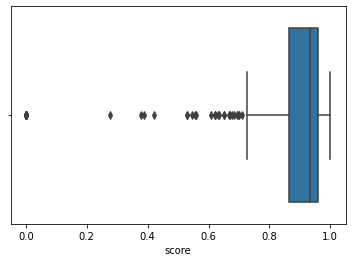

In [ ]:
sns.boxplot(x=prediction_score_df["score"])
plt.show()

In [ ]:
#Zero precision score 
len(prediction_score_df[prediction_score_df["score"]==0])

12

#Observation:-
- There are 12 images for which our model has predicted nothing
- Most of the images is with good precision i.e greater than 0.8

In [ ]:
#Here based on the presicion score we are dividing our dataframe into 3 sub dataframe 
#Worst prediction <- if score is less the 0.3
worst_prediction=prediction_score_df[prediction_score_df["score"]<=np.percentile(scr,3)]
#Medium prediction <- if score lies in the range of (0.3 to 0.95)
medium_prediction=prediction_score_df[list(map(lambda i: i>np.percentile(scr,3) and i<=np.percentile(scr,75), prediction_score_df["score"]))]
#Best prediction <- if score is above 0.95
best_prediction=prediction_score_df[prediction_score_df["score"]>np.percentile(scr,75)]

In [ ]:
print(prediction_score_df.shape)
print(worst_prediction.shape,medium_prediction.shape,best_prediction.shape)

(412, 4)
(13, 4) (296, 4) (103, 4)


In [ ]:
def show_image_from_df(X):
  """
  This function will take dataframe containing mask and scan image path and plot their images with their predicted mask images
  Note:- will only plot for top ten path according to index
  """
  n=10
  for i in tqdm(range(n)):
    fig, ax = plt.subplots(1,3,figsize = (15,5))
    index=i
    img = cv.imread(X['image'].iloc[index])
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    img = cv.resize(img ,IMG_SIZE)
    img = img / 255
    ax[0].imshow(img)
    ax[0].set_xlabel("Scan")
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)

    img_mask = cv.imread(X['mask'].iloc[index])
    img_mask = cv.cvtColor(img_mask, cv.COLOR_BGR2RGB)
    img_mask = cv.resize(img_mask ,IMG_SIZE)
    img_mask = img_mask / 255

    
    l=[]
    for i in pred[0][:,:,1]:
      l1=[]
      for j in i:
        if j>0.5:
          l1.append([0,0,0])
        else:
          l1.append([255,255,255])
      l.append(l1)

    ax[1].imshow(img_mask)
    ax[1].set_xlabel("Mask")
    ax[2].imshow(np.array(l))
    ax[2].set_xlabel("Predicted_mask")
    plt.show()focal_loss_fixed
    print(X['score'].iloc[index])

#Worst Prediction

  0%|          | 0/13 [00:00<?, ?it/s]

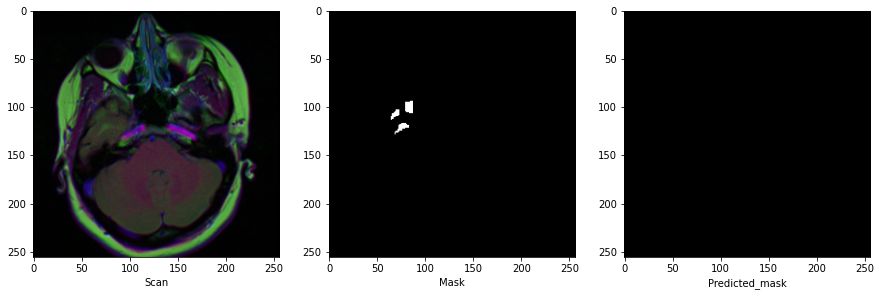

  8%|▊         | 1/13 [00:01<00:12,  1.00s/it]

0.0


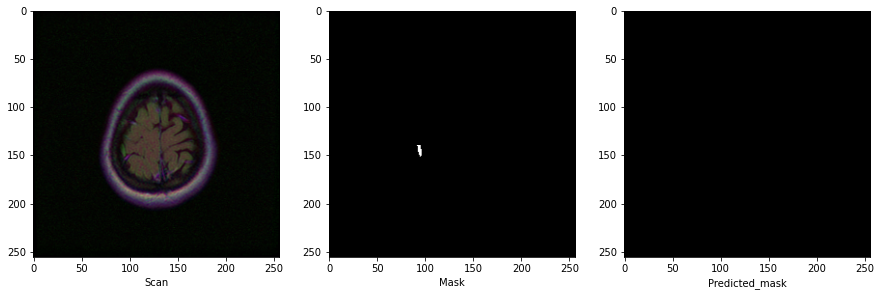

 15%|█▌        | 2/13 [00:01<00:09,  1.16it/s]

0.0


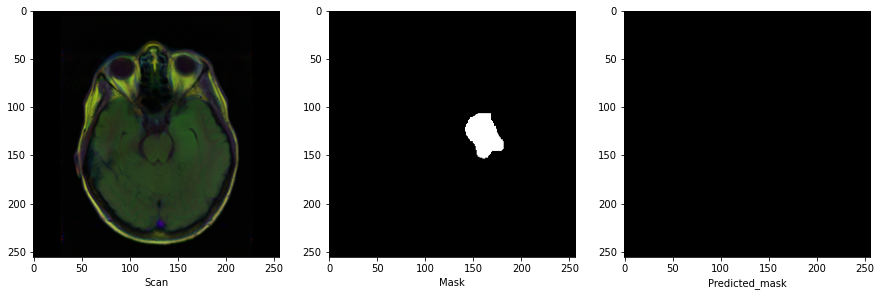

 23%|██▎       | 3/13 [00:02<00:09,  1.10it/s]

0.0


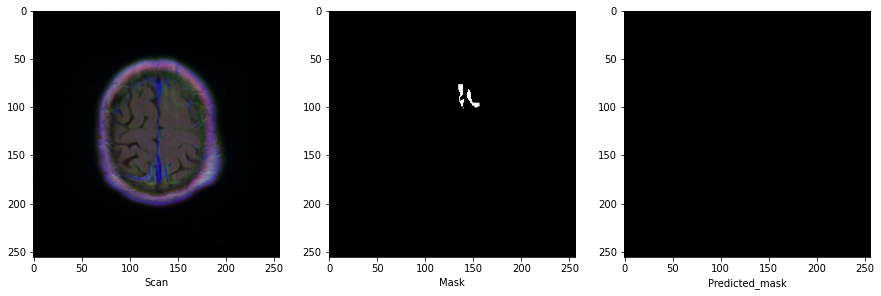

 31%|███       | 4/13 [00:04<00:10,  1.19s/it]

0.0


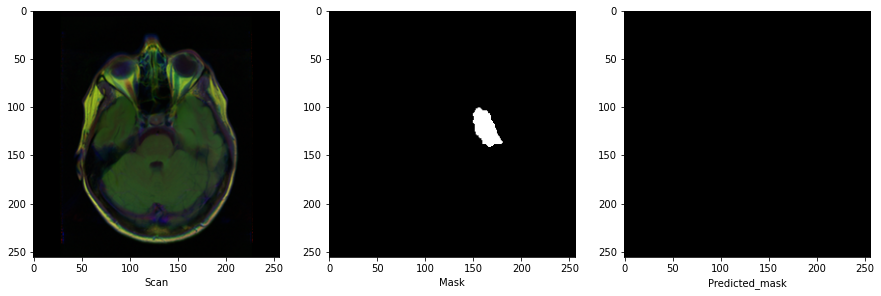

 38%|███▊      | 5/13 [00:05<00:10,  1.26s/it]

0.0


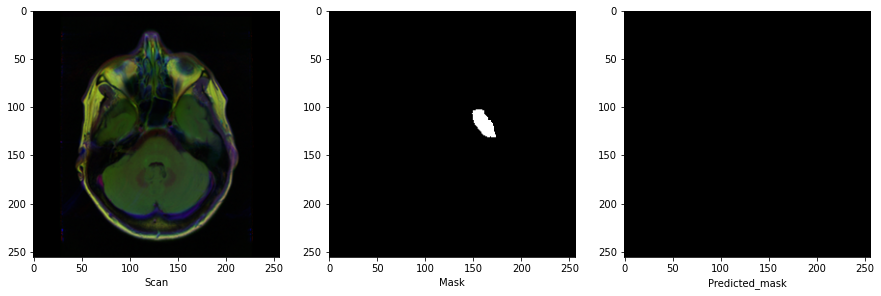

 46%|████▌     | 6/13 [00:07<00:09,  1.42s/it]

0.0


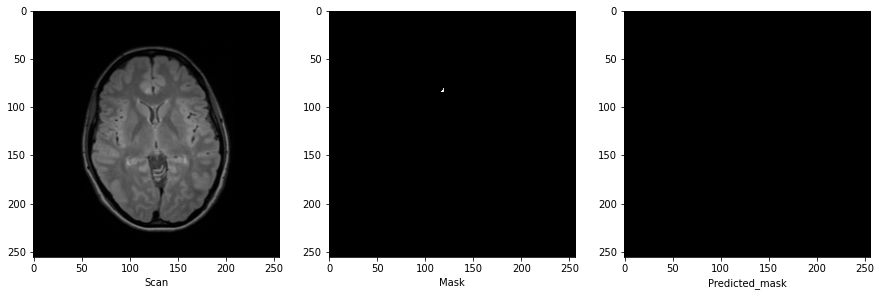

 54%|█████▍    | 7/13 [00:09<00:09,  1.51s/it]

0.0


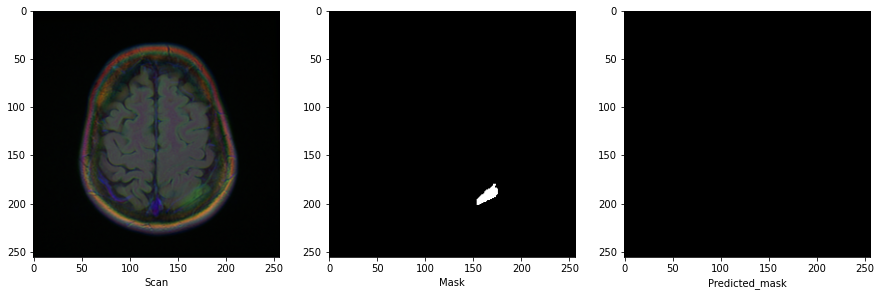

 62%|██████▏   | 8/13 [00:10<00:06,  1.34s/it]

0.0


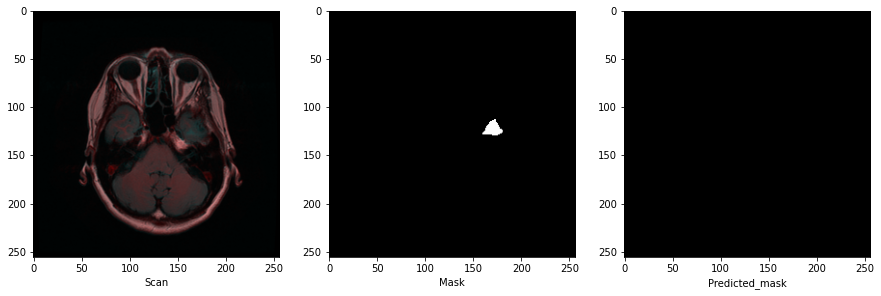

 69%|██████▉   | 9/13 [00:10<00:04,  1.16s/it]

0.0


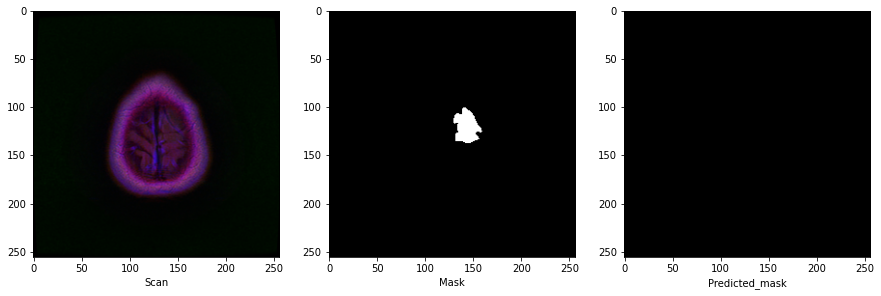

 77%|███████▋  | 10/13 [00:11<00:03,  1.10s/it]

0.0


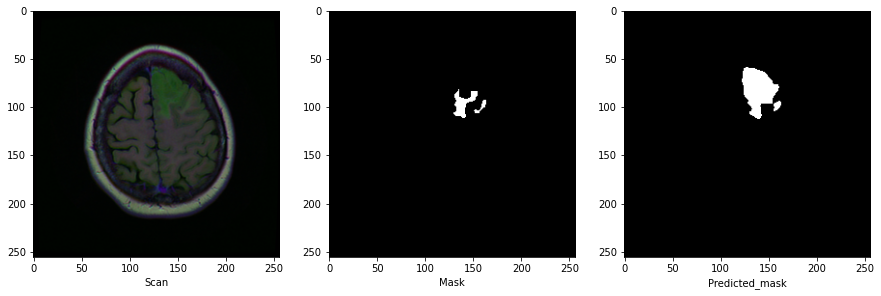

 85%|████████▍ | 11/13 [00:12<00:02,  1.07s/it]

0.276049766718507


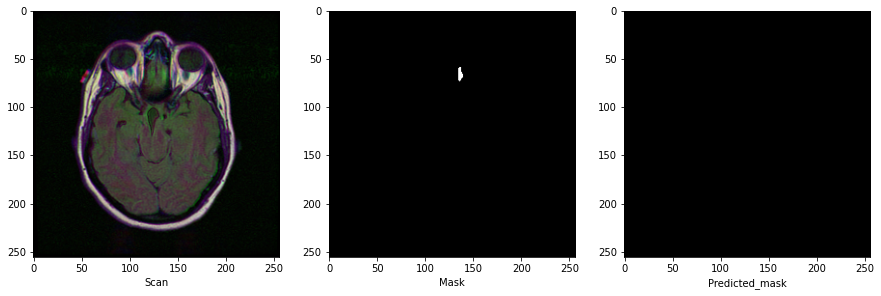

 92%|█████████▏| 12/13 [00:13<00:00,  1.02it/s]

0.0


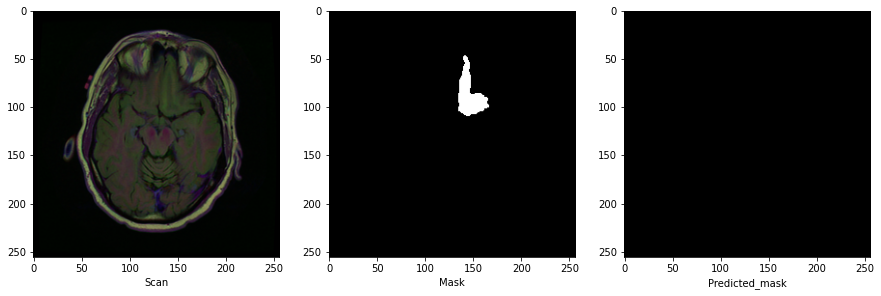

100%|██████████| 13/13 [00:14<00:00,  1.13s/it]

0.0


In [ ]:
# worst_prediction
show_image_from_df(worst_prediction)

### Observation:-
- Most of the worst predicted images are for those scan images where the abnormility is scattered in small region.
- Precision for 12 predicted mask images tends out to be zero
- There are 13 images with precision score of less than 0.3098 

In [ ]:
#mapping worst data to its correspoding data from the dataframe df according to scan image path
map_df_worst_data=df[list(map(lambda i: i in list(worst_prediction["image"]),df["mask_image_paths"]))]
map_df_worst_data.head(3)

,mask_image_paths,scan_image_paths,mask_image_shapes,scan_image_shapes,abnormality_percentage_area,location,closest_color
17,scan/TCGA_CS_6667_20011105_17.tif,mask/TCGA_CS_6667_20011105_17_mask.tif,"(256, 256, 3)","(256, 256, 3)",0.347900,Down_Right,green
507,scan/TCGA_DU_8165_19970205_12.tif,mask/TCGA_DU_8165_19970205_12_mask.tif,"(256, 256, 3)","(256, 256, 3)",0.321960,Top_Right,Black
691,scan/TCGA_DU_6404_19850629_44.tif,mask/TCGA_DU_6404_19850629_44_mask.tif,"(256, 256, 3)","(256, 256, 3)",0.056458,Down_Left,Black


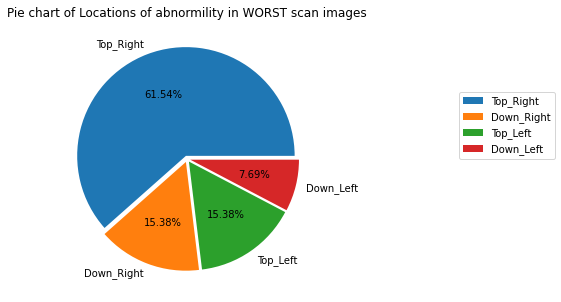

In [ ]:
# map_df_worst_data
#Plotting pie chart of Locations of abnormility in scan images
fig=plt.figure(figsize=(5,5))
explodes = [0.03]*len(map_df_worst_data["location"].value_counts())
plt.pie(labels=map_df_worst_data["location"].value_counts().keys(), x=map_df_worst_data["location"].value_counts().values,autopct='%1.2f%%',explode=explodes)
plt.title("Pie chart of Locations of abnormility in WORST scan images")
plt.legend(loc=(1.5,0.5))
plt.show()

### Observation:-
- The abnormility has been observed in the Top Right side of the real scan in 61.54% of the cases of worst prediction.

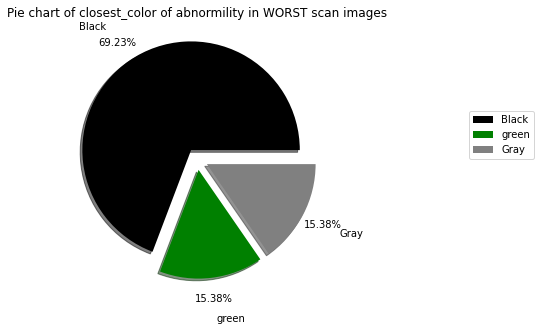

In [ ]:
# map_df_worst_data
#Plotting pie chart of closest_color of abnormility in scan images
fig=plt.figure(figsize=(5,5))
explodes = [0.1]*len(map_df_worst_data["closest_color"].value_counts())
plt.pie(labels=map_df_worst_data["closest_color"].value_counts().keys(),
        x=map_df_worst_data["closest_color"].value_counts().values,autopct='%1.2f%%',
        explode=explodes#, colors=["black","green","gray"]
        , pctdistance=1.2, labeldistance=1.38,shadow = True,colors=["black","green","gray","#4C1C24","#D3D3D3"])
plt.title("Pie chart of closest_color of abnormility in WORST scan images")
plt.legend(loc=(1.5,0.5))
plt.show()

### Observation 
- The abnormility has been observed in black color of the real scan in 69.23% of the cases of worst prediction.

#Good Prediction

  0%|          | 0/10 [00:00<?, ?it/s]

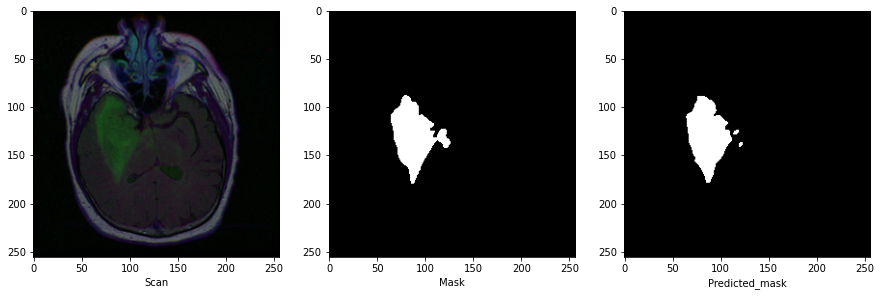

 10%|█         | 1/10 [00:00<00:08,  1.09it/s]

0.9479084451460142


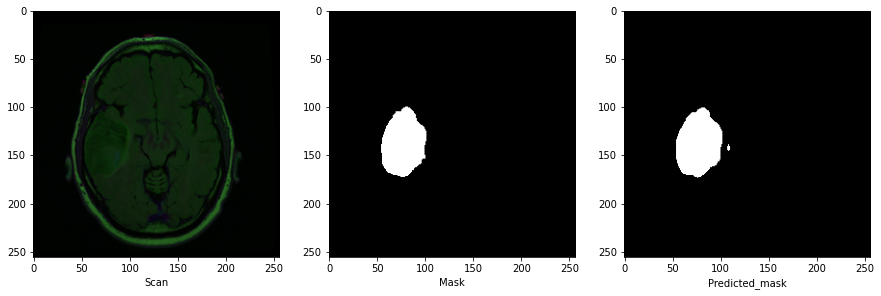

 20%|██        | 2/10 [00:01<00:07,  1.07it/s]

0.9558541266794626


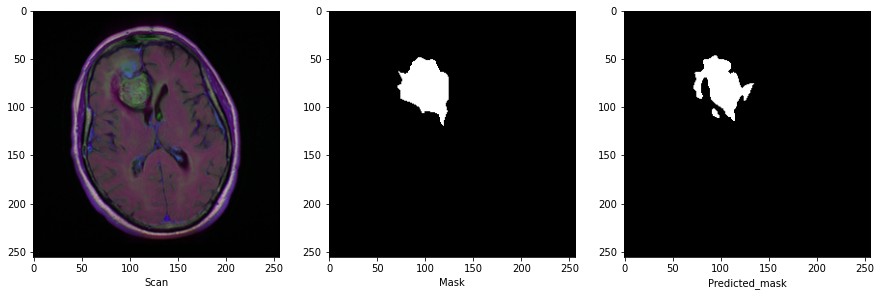

 30%|███       | 3/10 [00:02<00:06,  1.16it/s]

0.8592257415786827


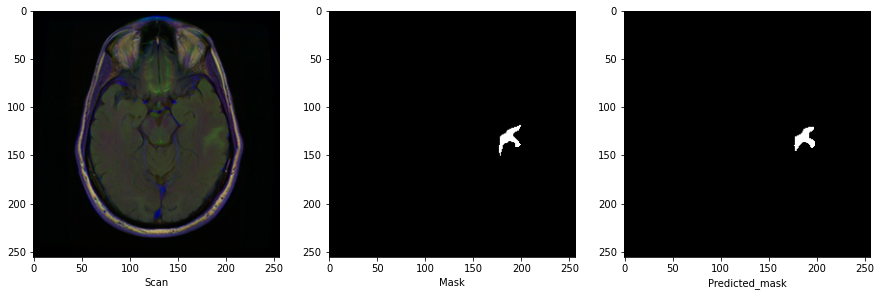

 40%|████      | 4/10 [00:03<00:05,  1.11it/s]

0.8953068592057761


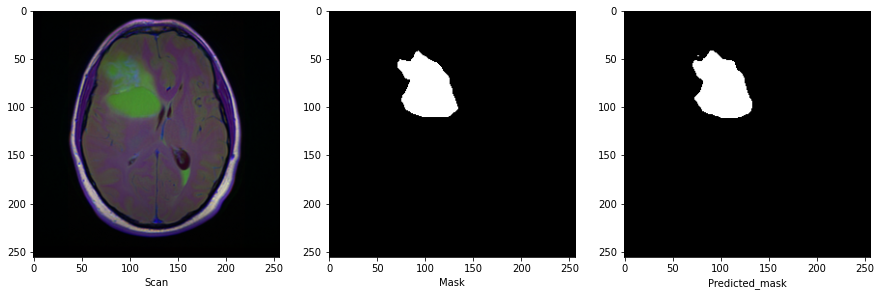

 50%|█████     | 5/10 [00:04<00:04,  1.16it/s]

0.9557432432432432


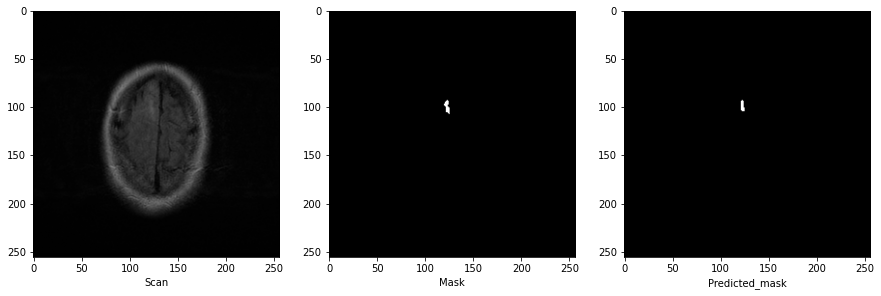

 60%|██████    | 6/10 [00:05<00:03,  1.12it/s]

0.9459459459459459


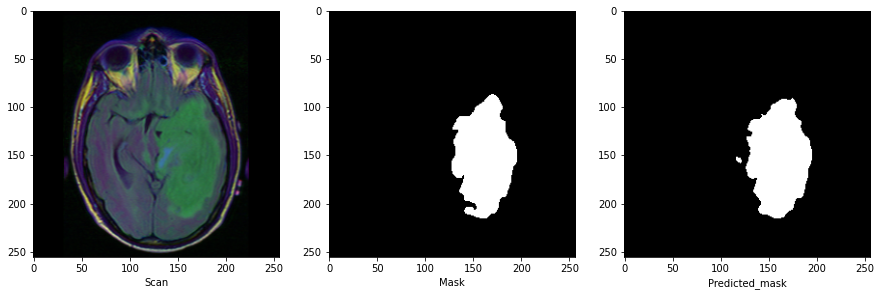

 70%|███████   | 7/10 [00:06<00:02,  1.17it/s]

0.9506949040370616


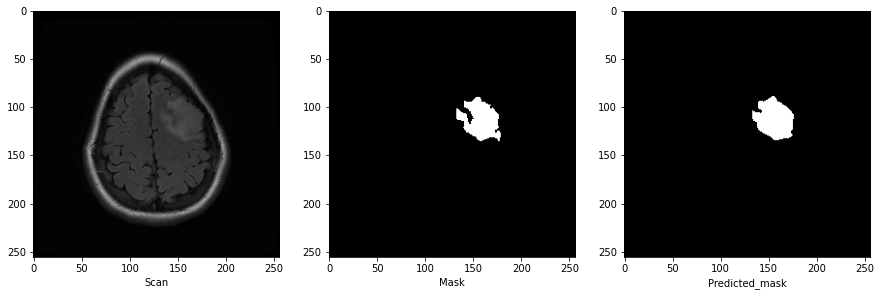

 80%|████████  | 8/10 [00:07<00:01,  1.12it/s]

0.9002233804914371


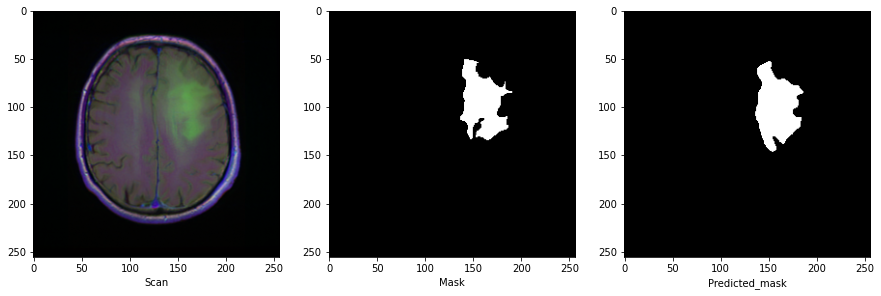

 90%|█████████ | 9/10 [00:07<00:00,  1.16it/s]

0.849290780141844


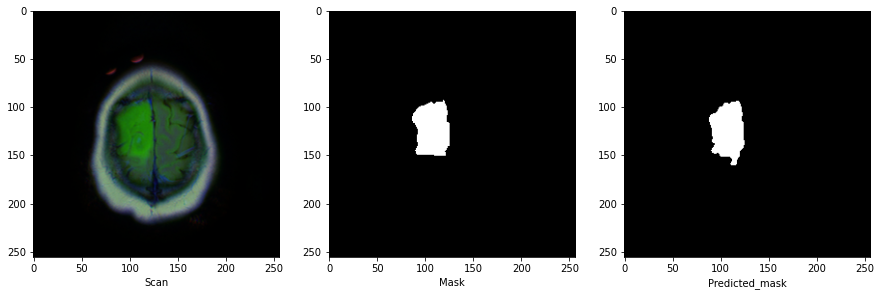

100%|██████████| 10/10 [00:08<00:00,  1.12it/s]

0.942627653471027


In [ ]:
# medium_prediction
show_image_from_df(medium_prediction)

### Observation:-
- Most of the predicted images are with good precision score are considered here
- Precision score for predicted images lies in the range of 0.3099 to 0.95

In [ ]:
#mapping medium data to its correspoding data from the dataframe df according to scan image path
map_df_medium_data=df[list(map(lambda i: i in list(medium_prediction["image"]),df["mask_image_paths"]))]
map_df_medium_data.head(3)

,mask_image_paths,scan_image_paths,mask_image_shapes,scan_image_shapes,abnormality_percentage_area,location,closest_color
3,scan/TCGA_FG_6689_20020326_27.tif,mask/TCGA_FG_6689_20020326_27_mask.tif,"(256, 256, 3)","(256, 256, 3)",6.347656,Top_Left,green
51,scan/TCGA_DU_5854_19951104_29.tif,mask/TCGA_DU_5854_19951104_29_mask.tif,"(256, 256, 3)","(256, 256, 3)",1.251221,Down_Left,Black
53,scan/TCGA_CS_4941_19960909_15.tif,mask/TCGA_CS_4941_19960909_15_mask.tif,"(256, 256, 3)","(256, 256, 3)",2.978516,Top_Left,green


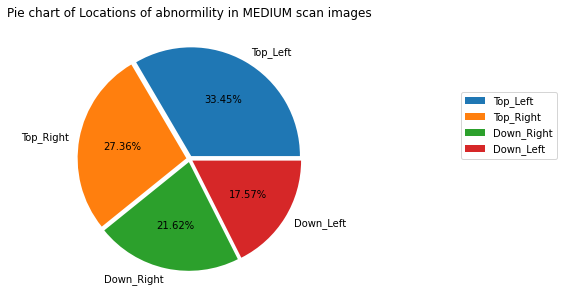

In [ ]:
# map_df_medium_data
#Plotting pie chart of Locations of abnormility in scan images
fig=plt.figure(figsize=(5,5))
explodes = [0.03]*len(map_df_medium_data["location"].value_counts())
plt.pie(labels=map_df_medium_data["location"].value_counts().keys(), x=map_df_medium_data["location"].value_counts().values,autopct='%1.2f%%',explode=explodes)
plt.title("Pie chart of Locations of abnormility in MEDIUM scan images")
plt.legend(loc=(1.5,0.5))
plt.show()

### Observation:-
- The abnormility has been observed in the Top Left side of the real scan in 33.45% of the cases of medium prediction.

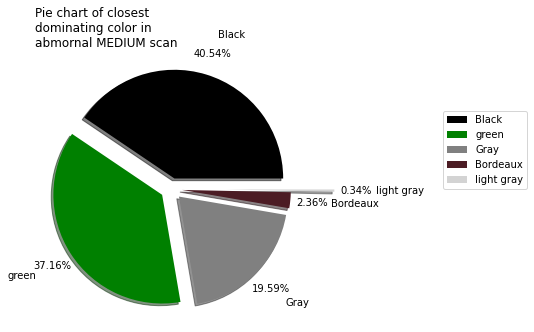

In [ ]:
#plotting Pie chart of closest dominating color in abmornal scan.
fig=plt.figure(figsize=(8,5))
explodes = [0.1]+[0.1]*(len(map_df_medium_data["closest_color"].value_counts())-3)+[0.1]+[0.5]
plt.pie(labels=map_df_medium_data["closest_color"].value_counts().keys(), x=map_df_medium_data["closest_color"].value_counts().values,
        pctdistance=1.2, labeldistance=1.38,explode=explodes,autopct='%1.2f%%',
        shadow = True,colors=["black","green","gray","#4C1C24","#D3D3D3"])
plt.title("Pie chart of closest \ndominating color in \nabmornal MEDIUM scan",loc="left")
plt.legend(loc=(1.5,0.5))
plt.show()

### Observation 
- The abnormility has been observed in black color of the real scan in 40.54% of the cases of worst prediction.

#Best Prediction

  0%|          | 0/10 [00:00<?, ?it/s]

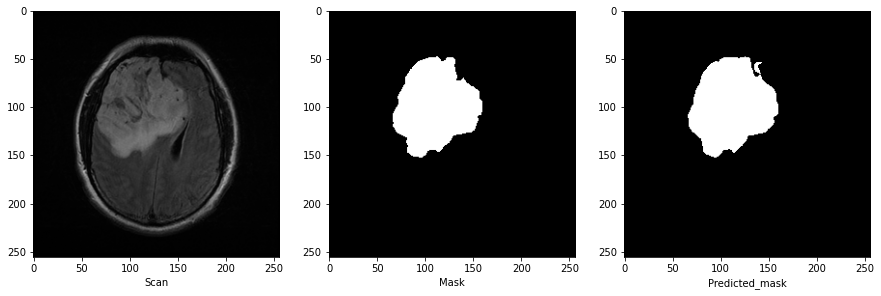

 10%|█         | 1/10 [00:02<00:20,  2.33s/it]

0.9602019602019602


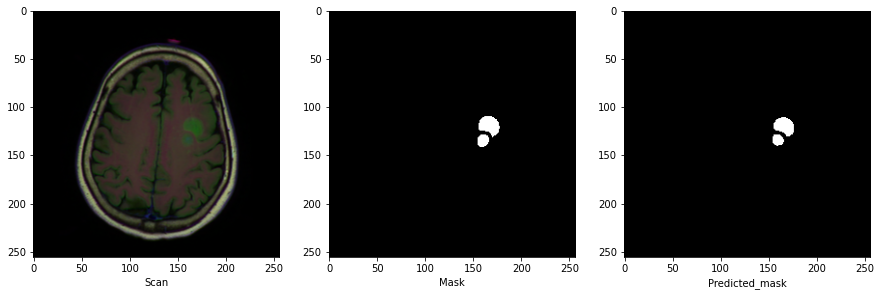

 20%|██        | 2/10 [00:03<00:15,  1.89s/it]

0.970873786407767


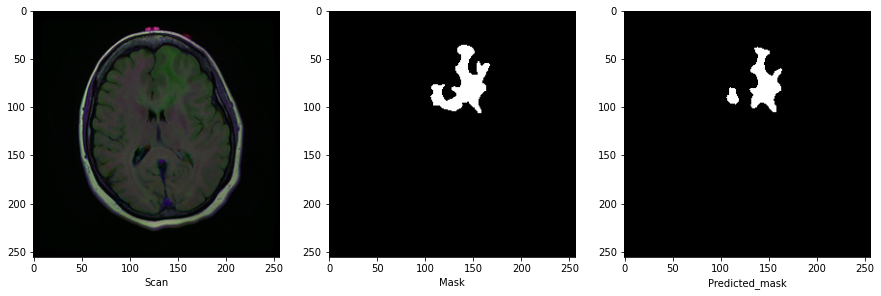

 30%|███       | 3/10 [00:06<00:15,  2.26s/it]

0.963130173062453


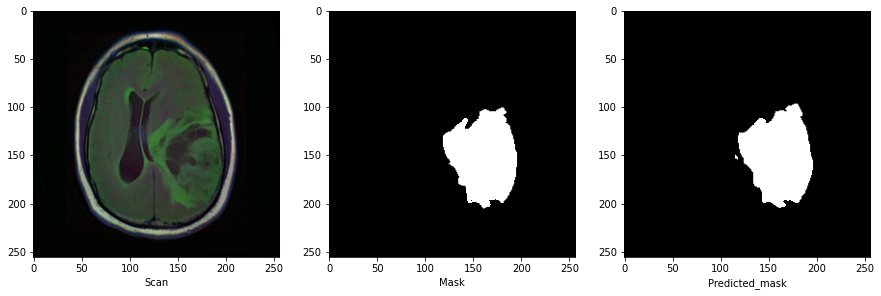

 40%|████      | 4/10 [00:08<00:11,  1.97s/it]

0.9617766766943904


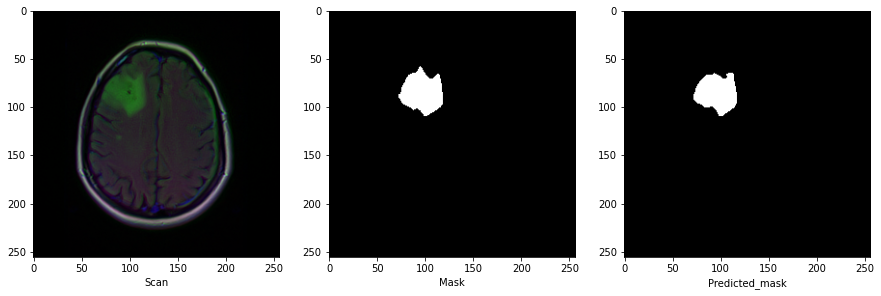

 50%|█████     | 5/10 [00:09<00:09,  1.86s/it]

0.9734079776067179


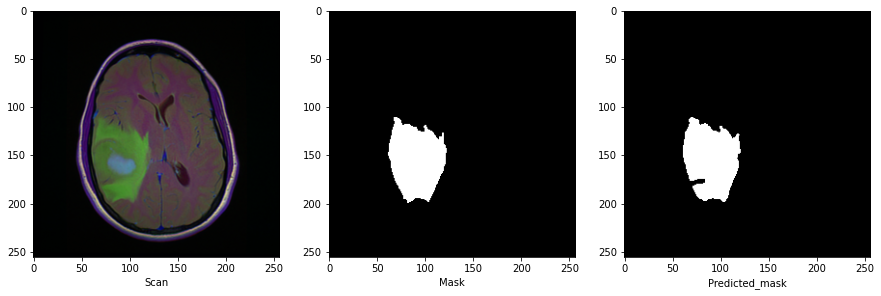

 60%|██████    | 6/10 [00:10<00:06,  1.51s/it]

0.9670064377682404


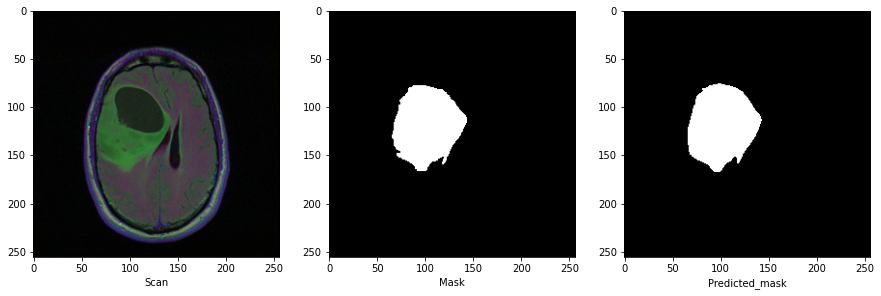

 70%|███████   | 7/10 [00:11<00:03,  1.33s/it]

0.9625


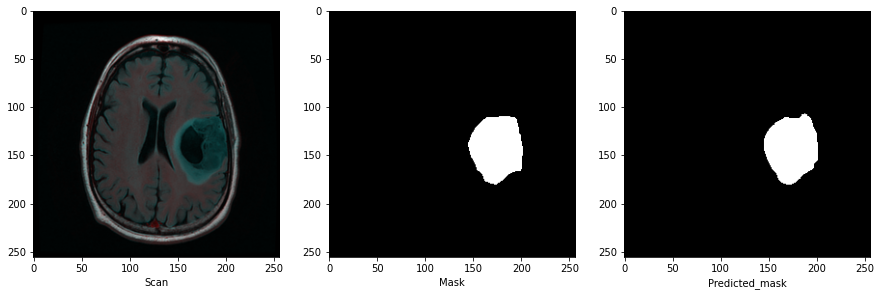

 80%|████████  | 8/10 [00:12<00:02,  1.22s/it]

0.9767213114754099


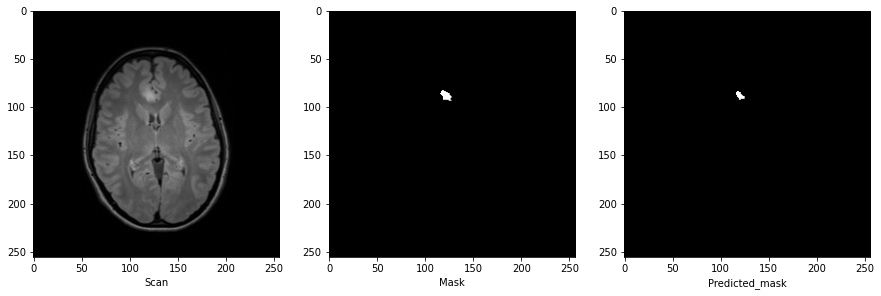

 90%|█████████ | 9/10 [00:13<00:01,  1.08s/it]

0.9787234042553191


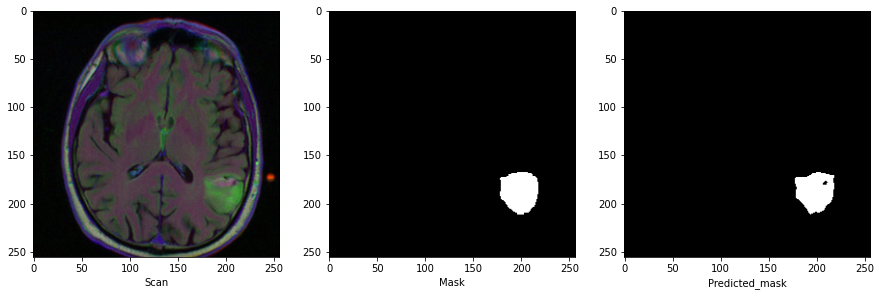

100%|██████████| 10/10 [00:14<00:00,  1.44s/it]

0.9688212927756654


In [ ]:
# best_prediction
show_image_from_df(best_prediction)

### Observation:-
- The best predictions have been made for scans in which the abnormility is separated in region by a significant bold hue.
- Precision score for predicted images lies in the range of 0.96 to 1

In [ ]:
##mapping best data to its correspoding data from the dataframe df according to scan image path
map_df_best_data=df[list(map(lambda i: i in list(best_prediction["image"]),df["mask_image_paths"]))]
map_df_best_data.head(3)

,mask_image_paths,scan_image_paths,mask_image_shapes,scan_image_shapes,abnormality_percentage_area,location,closest_color
114,scan/TCGA_HT_8114_19981030_19.tif,mask/TCGA_HT_8114_19981030_19_mask.tif,"(256, 256, 3)","(256, 256, 3)",3.166199,Down_Right,Gray
116,scan/TCGA_HT_7879_19981009_17.tif,mask/TCGA_HT_7879_19981009_17_mask.tif,"(256, 256, 3)","(256, 256, 3)",1.155090,Down_Left,Black
175,scan/TCGA_DU_5849_19950405_23.tif,mask/TCGA_DU_5849_19950405_23_mask.tif,"(256, 256, 3)","(256, 256, 3)",2.207947,Top_Right,Black


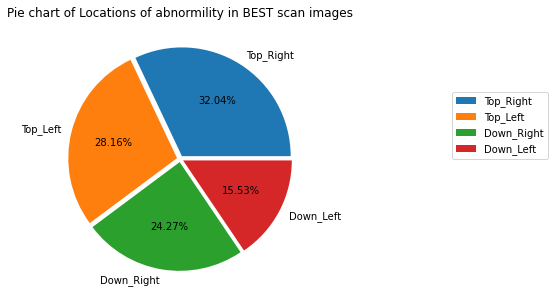

In [ ]:
# map_df_best_data
#Plotting pie chart of Locations of abnormility in scan images
fig=plt.figure(figsize=(5,5))
explodes = [0.03]*len(map_df_best_data["location"].value_counts())
plt.pie(labels=map_df_best_data["location"].value_counts().keys(), x=map_df_best_data["location"].value_counts().values,autopct='%1.2f%%',explode=explodes)
plt.title("Pie chart of Locations of abnormility in BEST scan images")
plt.legend(loc=(1.5,0.5))
plt.show()

### Observation:-
- The abnormility has been observed in the Top Right side of the real scan in 32.04% of the cases of best prediction.

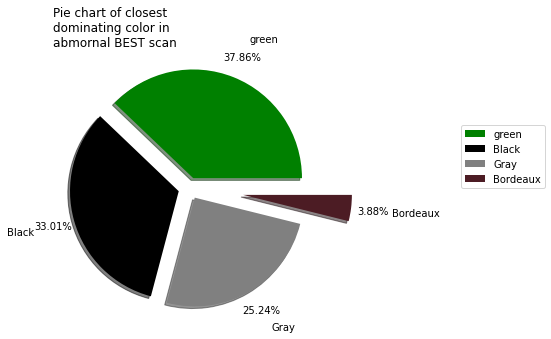

In [ ]:
#plotting Pie chart of closest dominating color in abmornal scan.
fig=plt.figure(figsize=(8,5))
explodes = [0.1]+[0.1]*(len(map_df_best_data["closest_color"].value_counts())-3)+[0.1]+[0.5]
plt.pie(labels=map_df_best_data["closest_color"].value_counts().keys(), x=map_df_best_data["closest_color"].value_counts().values, pctdistance=1.2, labeldistance=1.38,explode=explodes,autopct='%1.2f%%',shadow = True,colors=["green","black","gray","#4C1C24","#D3D3D3"])
plt.title("Pie chart of closest \ndominating color in \nabmornal BEST scan",loc="left")
plt.legend(loc=(1.5,0.5))
plt.show()

### Observation 
- The abnormility has been observed in Green color of the real scan in 37.86% of the cases of best prediction.

# Inference Pipeline.

I was given 110 patient data files in separate folders in this case study, which include their brain mri scan and their respective mask image for finding abnormalities in the mri scan.
To clean up our data, I create two folders, one for scan images and the other for mask images.

Then we did some image analysis to gain some insights from the data we were utilising, and as a result, we came up with some interesting ideas such as the location of abnormility in the scan, the dominant hue of abnormility in the scan, the percentage of pixel classified as abnormility, and so on.

Then we created a dataframe containing scan image path, mask image path, and a label that tells us whether the scan image is abnormal or not. The purpose of introducing this coloumn is that, because our dataset is imbalanced between abnormal and normal images, our train and test distributions may change if we randomly split the data. To counteract this, we introduced a label column so that we can stratify split our dataset.
Then, on an imagenet dataset, we load a pretrained U-Net architecture and frezze its encoder weights. Then we import our dataset from the image generator (flow from DataFrame), do prior image scaling, and augment the training image.

Then, for 50 epochs, we train our Unet architecture, resulting in a train IOU score of 0.42 and a test IOU score of 0.4.

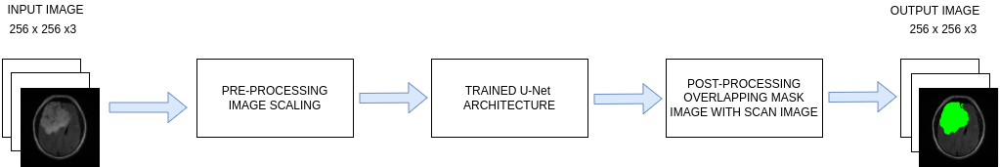

brain_mri.svg

##Conclusion
- After examining the model's predictions, I discovered that the best forecasts were made for scans in which the abnormility is separated in region by a considerable bold hue and can also be easily classified by our nacked eye. Despite the fact that our model performs admirably in almost all of the scan, with extremely high precision.